In [2]:
# Importing Libraries
import random
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import missingno as msno
from scipy.stats import entropy, ks_2samp, wasserstein_distance, chi2_contingency, skew, kurtosis

from sklearn.model_selection import train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, r2_score, mean_squared_error, mean_absolute_error
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression, LinearRegression, Ridge, Lasso, ElasticNet, HuberRegressor, RidgeCV, LassoCV, BayesianRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.svm import SVR
from sklearn.ensemble import StackingRegressor, GradientBoostingRegressor, RandomForestRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor, VotingRegressor
from sklearn.base import BaseEstimator, RegressorMixin, clone
from sklearn.multioutput import MultiOutputRegressor

from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
import shap

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.expand_frame_repr', False)

In [4]:
# Import the Dataset
file_path = "/kaggle/input/am-dataset/Data Value.xlsx"
data = pd.read_excel(file_path)

# EDA

In [5]:
data.head()

,Material,Weight Composition,Young's Modulus,Strength,Elongation
0,ABACA,2.0,24.019137,24.505401,5.030000
1,ABACA,5.0,98.960891,58.660387,6.130000
2,ABACA,8.0,106.450755,63.979777,7.660582
3,ABACA,10.0,153.564358,94.993355,8.293859
4,ABACA,15.0,251.509795,119.047385,8.155203


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 68 entries, 0 to 67
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Material            68 non-null     object 
 1   Weight Composition  68 non-null     float64
 2   Young's Modulus     68 non-null     float64
 3   Strength            68 non-null     float64
 4   Elongation          68 non-null     float64
dtypes: float64(4), object(1)
memory usage: 2.8+ KB


In [7]:
data.describe()

,Weight Composition,Young's Modulus,Strength,Elongation
count,68.000000,68.000000,68.000000,68.000000
mean,11.727941,152.948652,47.884350,8.876964
std,7.682814,102.291404,19.301083,2.870125
min,1.000000,24.019137,9.588186,4.561945
25%,5.750000,82.055092,35.328334,7.021330
50%,10.000000,131.412057,46.444554,7.980887
75%,15.750000,172.641181,58.698005,10.562500
max,30.000000,490.620855,119.047385,19.138211


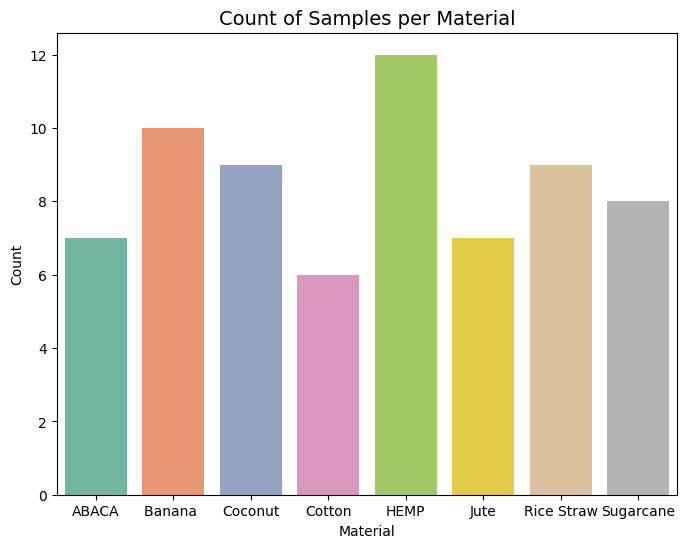

In [8]:
# No. of samples per Material
plt.figure(figsize=(8,6))
sns.countplot(data=data, x="Material", palette="Set2")
plt.title("Count of Samples per Material", fontsize=14)
plt.xlabel("Material")
plt.ylabel("Count")
plt.show()

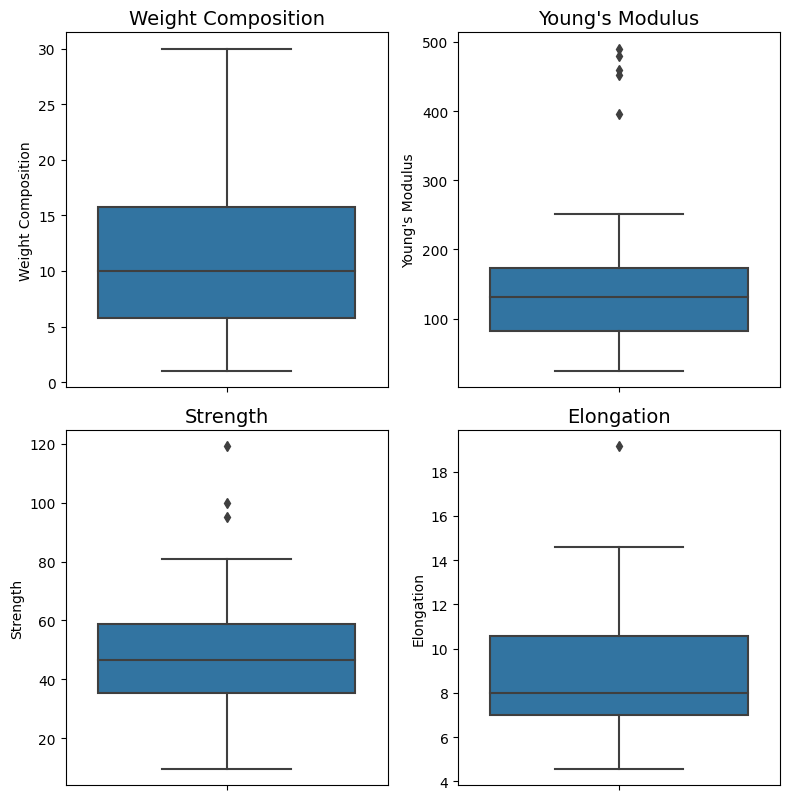

In [9]:
# Boxplot
num_cols = data.select_dtypes(include=["int64", "float64"]).columns

plt.figure(figsize=(8, 20))
plotnumber = 1

for col in num_cols:
    ax = plt.subplot(5, 2, plotnumber)
    sns.boxplot(y=data[col], ax=ax)
    ax.set_title(f"{col}", fontsize=14)
    plotnumber += 1

plt.tight_layout()
plt.show()

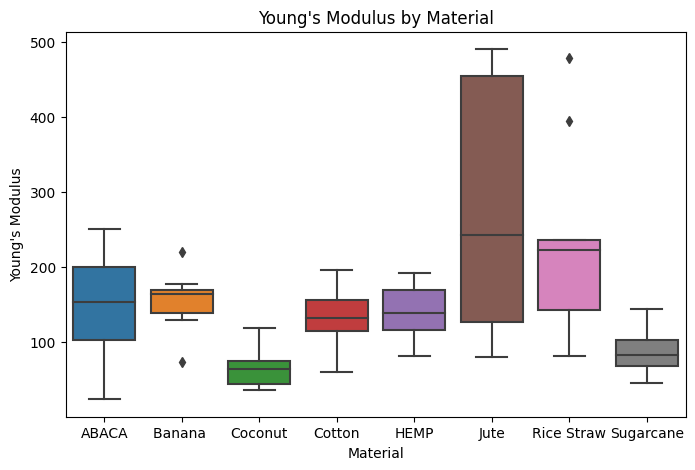

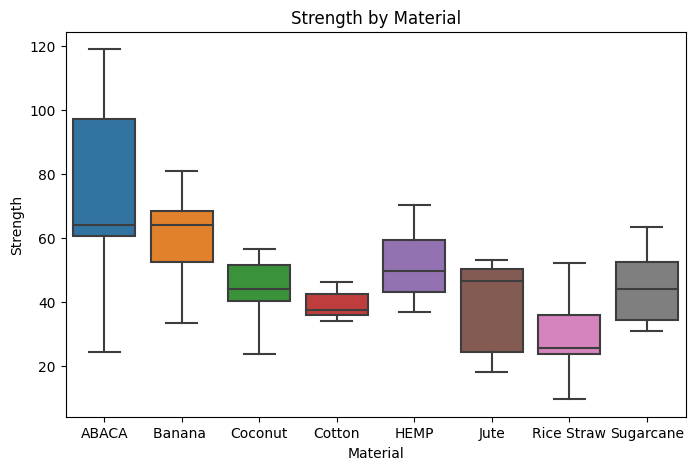

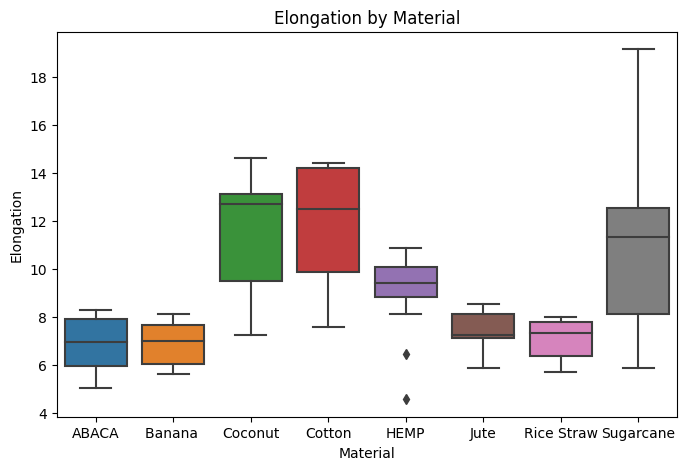

In [10]:
# Material wise Box Plots
features = ["Young's Modulus", "Strength", "Elongation"]
for feat in features:
    plt.figure(figsize=(8,5))
    sns.boxplot(data=data, x="Material", y=feat)
    plt.title(f"{feat} by Material")
    plt.show()

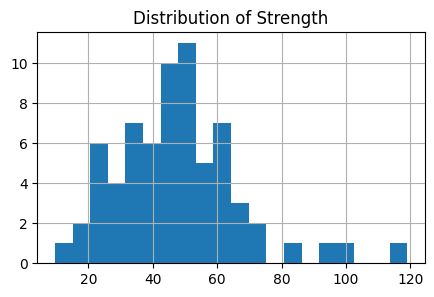

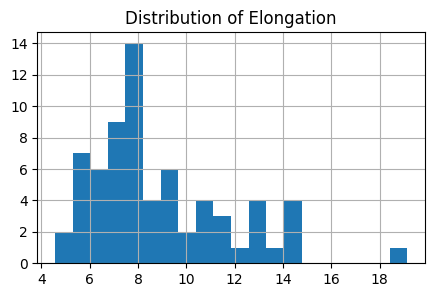

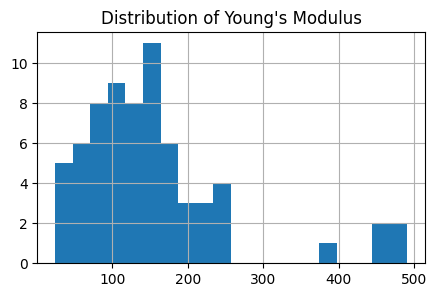

In [11]:
# Distribution Plots for output columns
for col in ["Strength", "Elongation", "Young's Modulus"]:
    plt.figure(figsize=(5,3))
    data[col].hist(bins=20)
    plt.title(f"Distribution of {col}")
    plt.show()

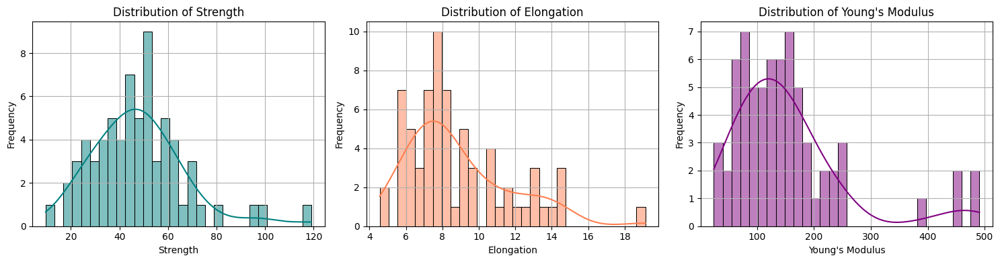

In [12]:
plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
sns.histplot(data['Strength'], kde=True, bins=30, color='teal')
plt.title('Distribution of Strength')
plt.xlabel('Strength')
plt.ylabel('Frequency')
plt.grid(True)

plt.subplot(1, 3, 2)
sns.histplot(data['Elongation'], kde=True, bins=30, color='coral')
plt.title('Distribution of Elongation')
plt.xlabel('Elongation')
plt.ylabel('Frequency')
plt.grid(True)

plt.subplot(1, 3, 3)
sns.histplot(data["Young's Modulus"], kde=True, bins=30, color='purple')
plt.title("Distribution of Young's Modulus")
plt.xlabel("Young's Modulus")
plt.ylabel('Frequency')
plt.grid(True)

plt.tight_layout()
plt.show()

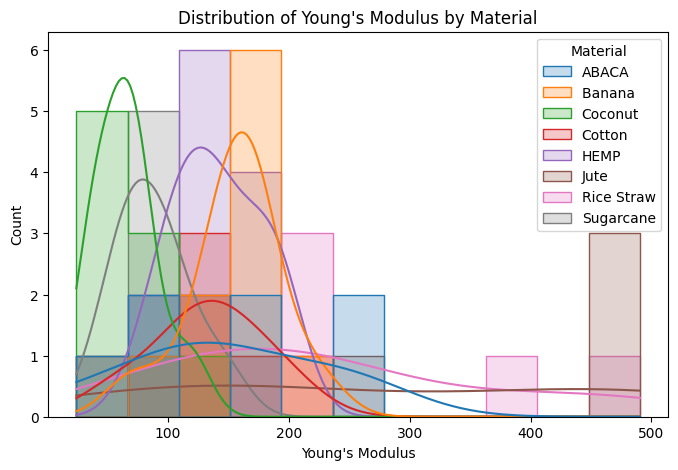

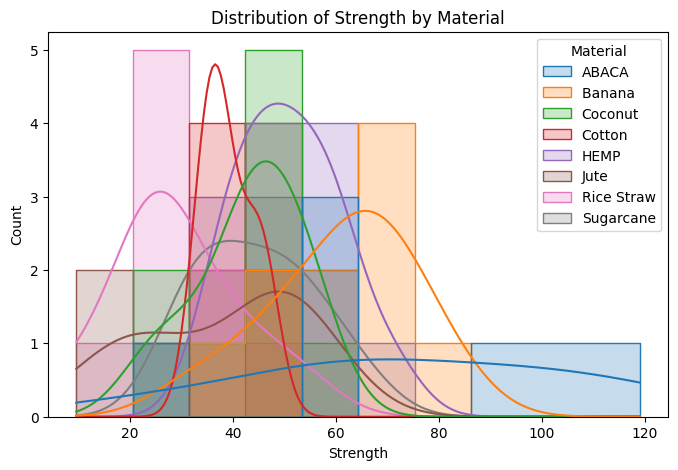

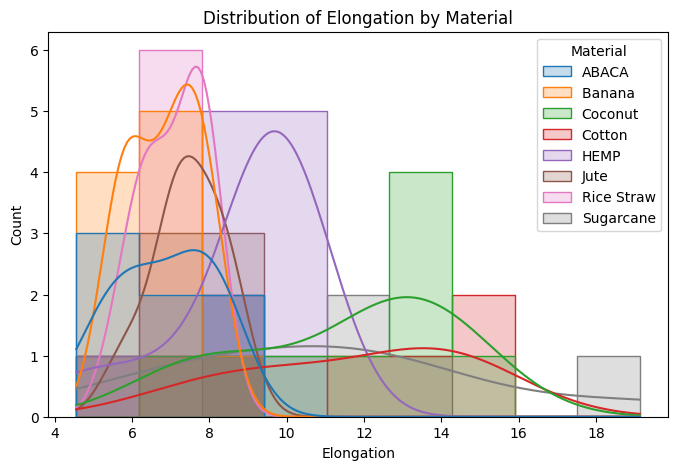

In [13]:
# Distribution Plots by material
features = ["Young's Modulus", "Strength", "Elongation"]

for feat in features:
    plt.figure(figsize=(8,5))
    sns.histplot(data=data, x=feat, hue="Material", kde=True, element="step")
    plt.title(f"Distribution of {feat} by Material")
    plt.show()

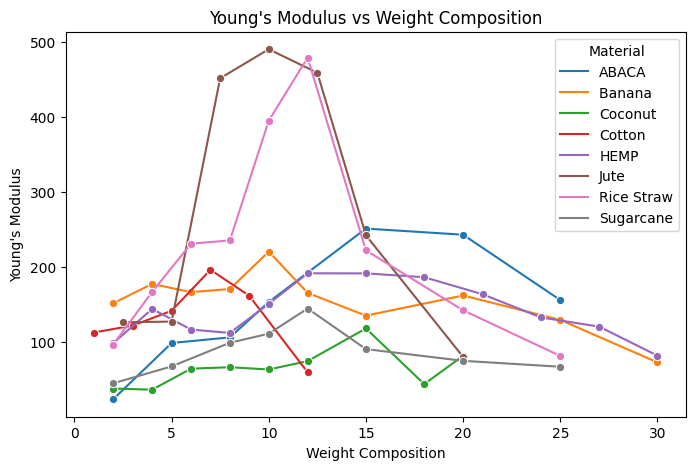

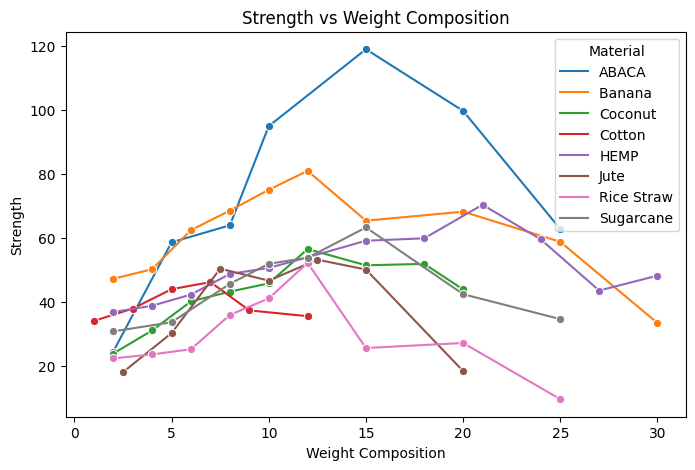

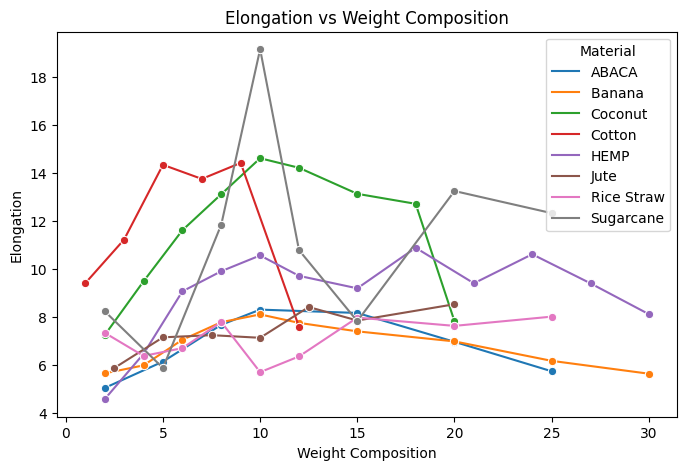

In [14]:
for feat in features:
    plt.figure(figsize=(8,5))
    sns.lineplot(data=data, x="Weight Composition", y=feat, hue="Material", marker="o")
    plt.title(f"{feat} vs Weight Composition")
    plt.show()

In [14]:
data['Elongation'] = np.log1p(data['Elongation'])
data["Young's Modulus"] = np.log1p(data["Young's Modulus"])

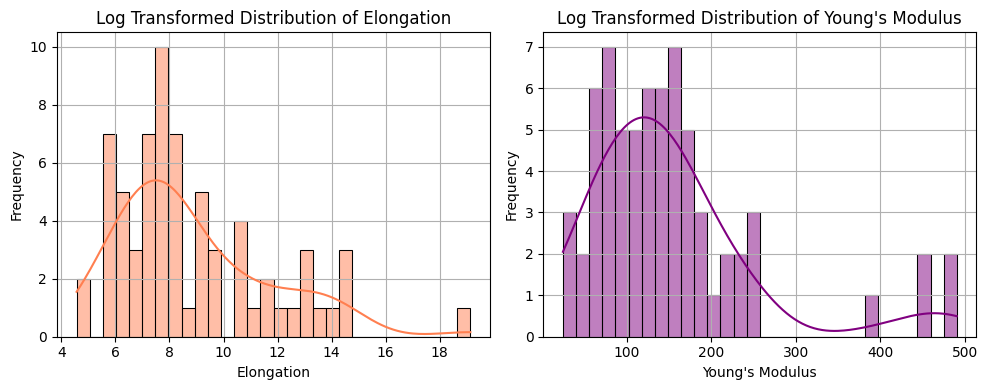

In [16]:
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
sns.histplot(data['Elongation'], kde=True, bins=30, color='coral')
plt.title('Log Transformed Distribution of Elongation')
plt.xlabel('Elongation')
plt.ylabel('Frequency')
plt.grid(True)

plt.subplot(1, 2, 2)
sns.histplot(data["Young's Modulus"], kde=True, bins=30, color='purple')
plt.title("Log Transformed Distribution of Young's Modulus")
plt.xlabel("Young's Modulus")
plt.ylabel('Frequency')
plt.grid(True)

plt.tight_layout()
plt.show()

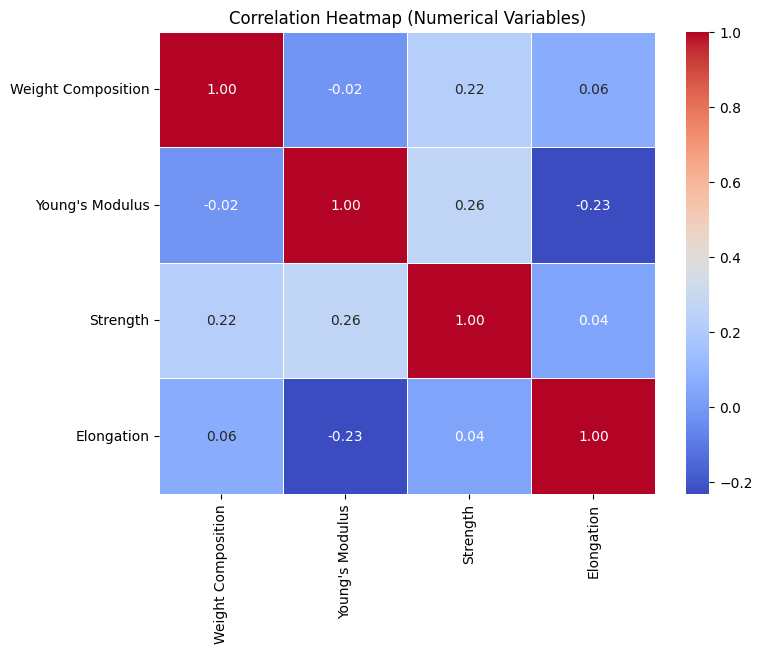

In [17]:
# Correlation Heatmap for numerical variables
numeric_data = data.select_dtypes(include=['int64', 'float64'])
corr_matrix = numeric_data.corr()

plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap (Numerical Variables)")
plt.show()

In [18]:
# One-hot encode the Material column
data = pd.get_dummies(data, columns=["Material"], drop_first=False)
print(data.head())

   Weight Composition  Young's Modulus    Strength  Elongation  Material_ABACA  Material_Banana   Material_Coconut  Material_Cotton  Material_HEMP  Material_Jute  Material_Rice Straw  Material_Sugarcane
0                 2.0        24.019137   24.505401    5.030000            True             False             False            False          False          False                False               False
1                 5.0        98.960891   58.660387    6.130000            True             False             False            False          False          False                False               False
2                 8.0       106.450755   63.979777    7.660582            True             False             False            False          False          False                False               False
3                10.0       153.564358   94.993355    8.293859            True             False             False            False          False          False                False      

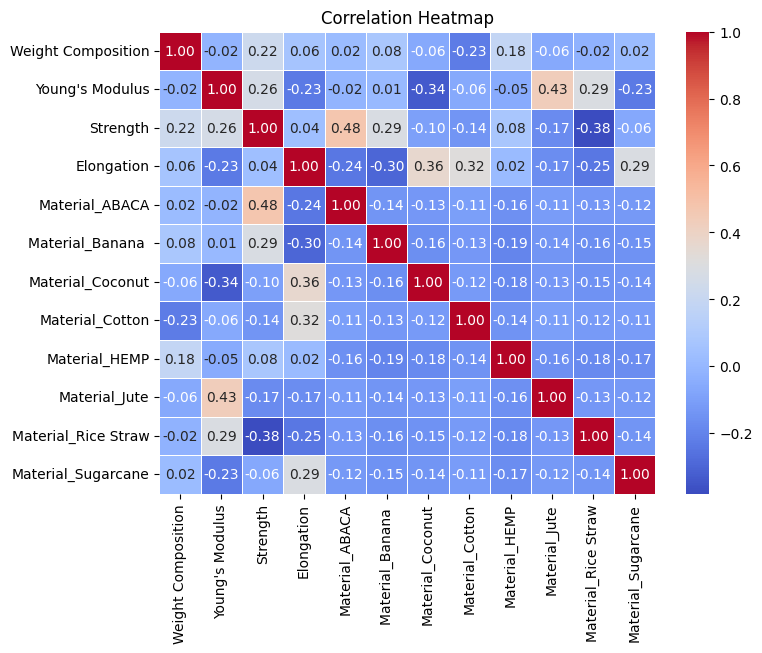

In [20]:
corr_matrix = data.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Heatmap")
plt.show()

In [21]:
# Store the real data
feature_cols = ["Weight Composition"] + [c for c in data if c.startswith("Material_")]
target_cols = ["Strength", "Elongation", "Young's Modulus"]
df_real = data[feature_cols + target_cols].copy()

# Synthetic Data Generation

In [22]:
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [24]:
# Split numerical and categorical features
numeric_cols = ["Weight Composition", "Strength", "Elongation", "Young's Modulus"]
categorical_cols = [c for c in df_real.columns if c.startswith("Material_")]

scaler = StandardScaler()
scaled_numeric = scaler.fit_transform(df_real[numeric_cols])

categorical_data = df_real[categorical_cols].values
data_scaled = np.hstack([scaled_numeric, categorical_data])

tensor_data = torch.tensor(data_scaled, dtype=torch.float32)
loader = torch.utils.data.DataLoader(torch.utils.data.TensorDataset(tensor_data, tensor_data), 
                                     batch_size=32, shuffle=True)

#  Autoencoder Definition
class MixedAutoencoder(nn.Module):
    def __init__(self, num_numeric, num_categories, encoding_dim=8):
        super().__init__()
        input_dim = num_numeric + num_categories
        self.num_numeric = num_numeric
        self.num_categories = num_categories

        # Shared encoder
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.2),

            nn.Linear(128, 64),
            nn.BatchNorm1d(64),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.2),

            nn.Linear(64, encoding_dim)
        )

        # Shared decoder
        self.decoder = nn.Sequential(
            nn.Linear(encoding_dim, 64),
            nn.BatchNorm1d(64),
            nn.LeakyReLU(0.2),

            nn.Linear(64, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2),

            nn.Linear(128, input_dim)  # output splits into numeric + categorical
        )

    def forward(self, x):
        z = self.encoder(x)
        out = self.decoder(z)
    
        numeric_out = out[:, :self.num_numeric]
        categorical_out = out[:, self.num_numeric:]
        return numeric_out, categorical_out


# Training Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ae = MixedAutoencoder(num_numeric=len(numeric_cols), num_categories=len(categorical_cols)).to(device)

opt = optim.Adam(ae.parameters(), lr=1e-3, weight_decay=1e-5)
crit_numeric = nn.MSELoss()
crit_categ = nn.BCEWithLogitsLoss()  # better for one-hot categories


# Training Loop
best_loss, patience = np.inf, 0
for epoch in range(500):
    ae.train()
    running = 0.0
    for xb, _ in loader:
        xb = xb.to(device)
        num_real = xb[:, :len(numeric_cols)]
        cat_real = xb[:, len(numeric_cols):]

        opt.zero_grad()
        num_pred, cat_pred = ae(xb)

        loss_num = crit_numeric(num_pred, num_real)
        loss_cat = crit_categ(cat_pred, cat_real)
        loss = loss_num + loss_cat

        loss.backward()
        opt.step()
        running += loss.item() * xb.size(0)

    avg_loss = running / len(loader.dataset)

    if avg_loss < best_loss:
        best_loss, patience = avg_loss, 0
        torch.save(ae.state_dict(), "best_mixed_autoencoder.pt")
    else:
        patience += 1

    if patience >= 50:
        print(f"⏹ Early stopping at epoch {epoch}, best loss={best_loss:.6f}")
        break

ae.load_state_dict(torch.load("best_mixed_autoencoder.pt"))
ae.eval()
print(f"Autoencoder trained (best loss={best_loss:.6f})")

⏹ Early stopping at epoch 369, best loss=0.089165
Autoencoder trained (best loss=0.089165)


In [25]:
latent = ae.encoder(tensor_data.to(device)).detach().cpu().numpy()

n_synth = 1500
idx = np.random.choice(len(latent), size=n_synth, replace=True)
latent_seed = latent[idx]

latent_noisy = latent_seed + np.random.normal(0, 0.15, latent_seed.shape)

latent_tensor = torch.tensor(latent_noisy, dtype=torch.float32).to(device)
with torch.no_grad():
    out = ae.decoder(latent_tensor)
    num_pred = out[:, :len(numeric_cols)]
    cat_pred = out[:, len(numeric_cols):]

num_synthetic = scaler.inverse_transform(num_pred.cpu().numpy())

cat_probs = torch.softmax(cat_pred, dim=1).cpu().numpy()
cat_synthetic = (cat_probs == cat_probs.max(axis=1, keepdims=True)).astype(int)

synthetic_data = pd.DataFrame(
    np.hstack([num_synthetic, cat_synthetic]),
    columns=numeric_cols + categorical_cols
)
print("Synthetic shape:", synthetic_data.shape)

Synthetic shape: (1500, 12)


In [26]:
synthetic_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Weight Composition   1500 non-null   float64
 1   Strength             1500 non-null   float64
 2   Elongation           1500 non-null   float64
 3   Young's Modulus      1500 non-null   float64
 4   Material_ABACA       1500 non-null   float64
 5   Material_Banana      1500 non-null   float64
 6   Material_Coconut     1500 non-null   float64
 7   Material_Cotton      1500 non-null   float64
 8   Material_HEMP        1500 non-null   float64
 9   Material_Jute        1500 non-null   float64
 10  Material_Rice Straw  1500 non-null   float64
 11  Material_Sugarcane   1500 non-null   float64
dtypes: float64(12)
memory usage: 140.8 KB


In [27]:
# Summary statistics of Real vs Synthetic
stats_real = df_real.describe().T 
stats_synth = synthetic_data.describe().T

stats_real["median"] = df_real.median()
stats_synth["median"] = synthetic_data.median()

comparison = stats_real[["mean", "median", "std", "min", "max"]].join(
    stats_synth[["mean", "median", "std", "min", "max"]],
    lsuffix="_real",
    rsuffix="_synthetic"
)

print("\n Real vs Synthetic Statistics")
display(comparison)


 Real vs Synthetic Statistics


,mean_real,median_real,std_real,min_real,max_real,mean_synthetic,median_synthetic,std_synthetic,min_synthetic,max_synthetic
Weight Composition,11.727941,10.000000,7.682814,1.000000,30.000000,11.523315,10.291115,6.517203,0.307871,29.779274
Strength,47.884350,46.444554,19.301083,9.588186,119.047385,47.608970,46.333408,17.645187,11.582490,120.205116
Elongation,8.876964,7.980887,2.870125,4.561945,19.138211,8.682124,8.022087,2.406173,4.718562,18.681870
Young's Modulus,152.948652,131.412057,102.291404,24.019137,490.620855,148.927520,131.056511,82.784620,33.536442,449.759521


In [28]:
# P value test
from scipy.stats import ks_2samp
results = []

for col in df_real.columns:
    if col in synthetic_data.columns: 
        ks_stat, p_value = ks_2samp(df_real[col], synthetic_data[col])
        results.append({
            "Feature": col,
            "KS Statistic": ks_stat,
            "p-value": p_value,
            "Significant (p<0.05)": p_value < 0.05
        })
        
ks_results = pd.DataFrame(results)
print(ks_results)

                Feature  KS Statistic   p-value  Significant (p<0.05)
0    Weight Composition      0.094275  0.575847                 False
1        Material_ABACA      0.007725  1.000000                 False
2      Material_Banana       0.004275  1.000000                 False
3      Material_Coconut      0.001686  1.000000                 False
4       Material_Cotton      0.007569  1.000000                 False
5         Material_HEMP      0.002471  1.000000                 False
6         Material_Jute      0.000275  1.000000                 False
7   Material_Rice Straw      0.000314  1.000000                 False
8    Material_Sugarcane      0.000314  1.000000                 False
9              Strength      0.067373  0.908933                 False
10           Elongation      0.077608  0.798453                 False
11      Young's Modulus      0.098431  0.521036                 False


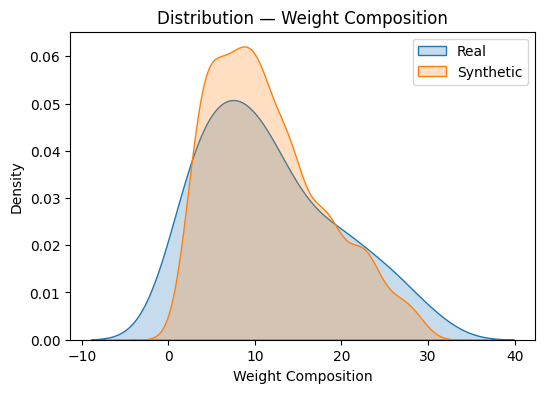

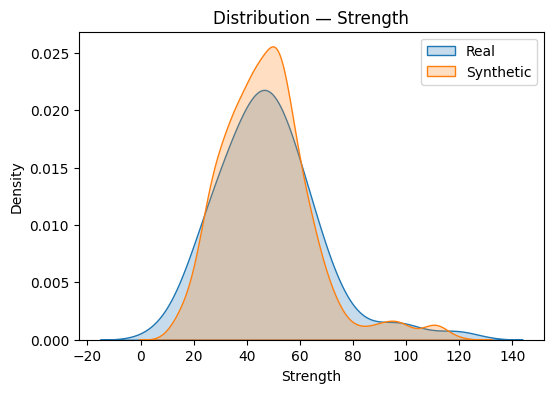

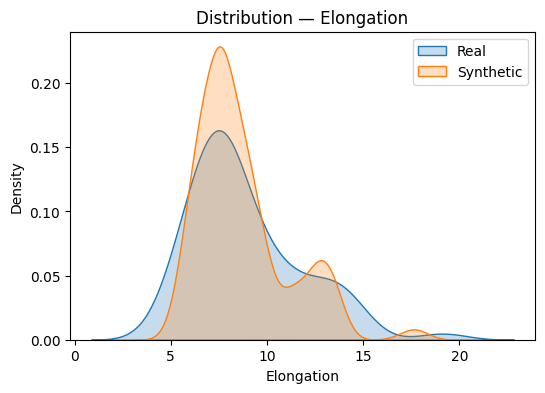

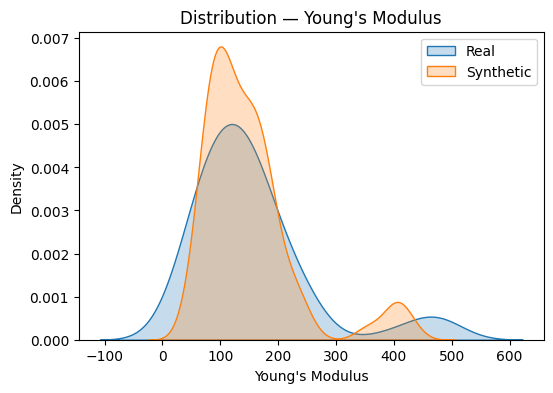

In [29]:
# Numerical distribution plots 
for col in numeric_cols:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(df_real[col], label="Real", fill=True)
    sns.kdeplot(synthetic_data[col], label="Synthetic", fill=True)
    plt.title(f"Distribution — {col}")
    plt.legend()
    plt.show()

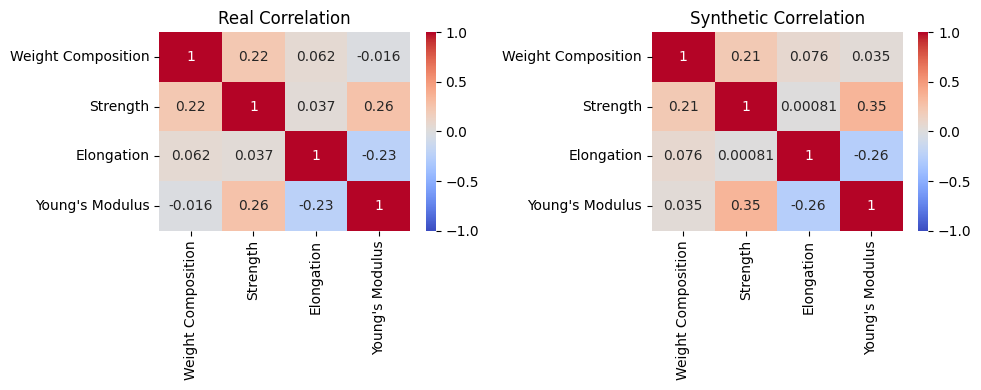

In [30]:
# Correlation heatmaps Comparison
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
sns.heatmap(df_real[numeric_cols].corr(), annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Real Correlation")

plt.subplot(1, 2, 2)
sns.heatmap(synthetic_data[numeric_cols].corr(), annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Synthetic Correlation")

plt.tight_layout()
plt.show()

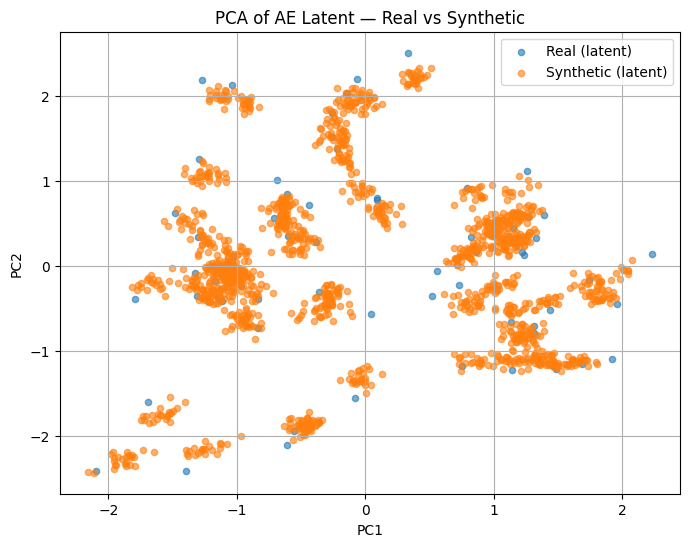

In [33]:
X_real_enc = np.hstack([
    scaler.transform(df_real[numeric_cols]),
    df_real[categorical_cols].values.astype(float)  
]).astype(np.float32)

X_synth_enc = np.hstack([
    scaler.transform(synthetic_data[numeric_cols]),
    synthetic_data[categorical_cols].values.astype(float)
]).astype(np.float32)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
ae.to(device)
ae.eval()

with torch.no_grad():
    z_real = ae.encoder(torch.tensor(X_real_enc).to(device)).cpu().numpy()
    z_synth = ae.encoder(torch.tensor(X_synth_enc).to(device)).cpu().numpy()

Z = np.vstack([z_real, z_synth])
pca = PCA(n_components=2)
proj_latent = pca.fit_transform(Z)

n_real = len(df_real)
plt.figure(figsize=(8,6))
plt.scatter(proj_latent[:n_real,0], proj_latent[:n_real,1], label='Real (latent)', alpha=0.6, s=20)
plt.scatter(proj_latent[n_real:,0], proj_latent[n_real:,1], label='Synthetic (latent)', alpha=0.6, s=20)
plt.title('PCA of AE Latent — Real vs Synthetic')
plt.xlabel('PC1'); plt.ylabel('PC2')
plt.legend(); plt.grid(True)
plt.show()

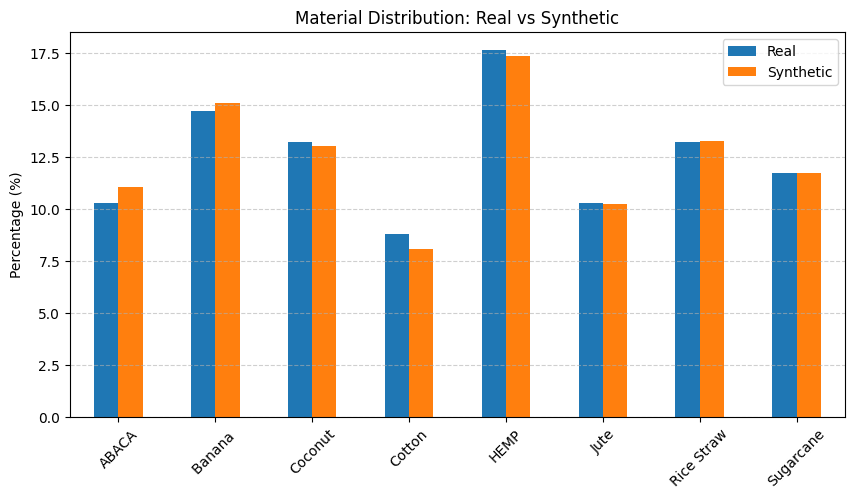

             Real  Synthetic
ABACA       10.29      11.07
Banana      14.71      15.13
Coconut     13.24      13.07
Cotton       8.82       8.07
HEMP        17.65      17.40
Jute        10.29      10.27
Rice Straw  13.24      13.27
Sugarcane   11.76      11.73


In [34]:
def plot_material_distribution(real_df, synth_df, categorical_cols):
    """Compare material distributions between real and synthetic data."""
    
    real_labels = real_df[categorical_cols].idxmax(axis=1).str.replace("Material_", "")
    synth_labels = synth_df[categorical_cols].idxmax(axis=1).str.replace("Material_", "")
    
    real_freq = real_labels.value_counts(normalize=True).sort_index()
    synth_freq = synth_labels.value_counts(normalize=True).sort_index()
    
    freq_df = pd.DataFrame({
        "Real": real_freq,
        "Synthetic": synth_freq
    }).fillna(0) * 100 
    
    freq_df.plot(kind="bar", figsize=(10,5))
    plt.title("Material Distribution: Real vs Synthetic")
    plt.ylabel("Percentage (%)")
    plt.xticks(rotation=45)
    plt.grid(axis="y", linestyle="--", alpha=0.6)
    plt.show()
    
    return freq_df
    
freq_comparison = plot_material_distribution(df_real, synthetic_data, categorical_cols)
print(freq_comparison.round(2))

In [35]:
def categorical_metrics(real_df, synth_df, categorical_cols):
    """Compute prevalence error (L1) and KL divergence between real and synthetic materials."""
    
    real_labels = real_df[categorical_cols].idxmax(axis=1).str.replace("Material_", "")
    synth_labels = synth_df[categorical_cols].idxmax(axis=1).str.replace("Material_", "")
    
    real_freq = real_labels.value_counts(normalize=True).sort_index()
    synth_freq = synth_labels.value_counts(normalize=True).sort_index()
    real_freq, synth_freq = real_freq.align(synth_freq, fill_value=0)
    
    l1_error = (real_freq - synth_freq).abs().sum()
    eps = 1e-9
    kl_div = entropy(real_freq + eps, synth_freq + eps)
    
    return l1_error, kl_div, pd.DataFrame({
        "Real %": (real_freq * 100).round(2),
        "Synthetic %": (synth_freq * 100).round(2),
        "Abs Diff %": ((real_freq - synth_freq).abs() * 100).round(2)
    })

l1, kl, comp_table = categorical_metrics(df_real, synthetic_data, categorical_cols)

print(f"📊 Categorical Metrics:")
print(f"L1 Error (total % mismatch): {l1*100:.2f}%")
print(f"KL Divergence: {kl:.4f}")
display(comp_table)

📊 Categorical Metrics:
L1 Error (total % mismatch): 2.46%
KL Divergence: 0.0007


,Real %,Synthetic %,Abs Diff %
ABACA,10.29,11.07,0.77
Banana,14.71,15.13,0.43
Coconut,13.24,13.07,0.17
Cotton,8.82,8.07,0.76
HEMP,17.65,17.40,0.25
Jute,10.29,10.27,0.03
Rice Straw,13.24,13.27,0.03
Sugarcane,11.76,11.73,0.03


In [40]:
def evaluate_synthetic_data(real_df, synth_df):
    
    results = {}

    real_df = real_df[real_df.columns.intersection(synth_df.columns)]
    synth_df = synth_df[real_df.columns]

    numeric_cols = real_df.select_dtypes(include=np.number).columns
    cat_cols = real_df.select_dtypes(exclude=np.number).columns

    print("\n🔹 Statistical Similarity Metrics")
    ks_results, wdist_results = {}, {}

    for col in numeric_cols:
        stat, pval = ks_2samp(real_df[col], synth_df[col])
        ks_results[col] = pval
        wdist_results[col] = wasserstein_distance(real_df[col], synth_df[col])

    print("\nKolmogorov–Smirnov (p-values):")
    for col, val in ks_results.items():
        print(f"{col:20} : {val:.4f}")

    print("\nWasserstein Distance:")
    for col, val in wdist_results.items():
        print(f"{col:20} : {val:.4f}")

    if len(cat_cols) > 0:
        print("\nChi-Square Tests (categorical):")
        for col in cat_cols:
            obs = pd.concat([
                real_df[col].value_counts(),
                synth_df[col].value_counts()
            ], axis=1).fillna(0)
            chi2, pval, _, _ = chi2_contingency(obs)
            print(f"{col:20} : p={pval:.4f}")

    print("\n🔹 Correlation Matrix Similarity")
    corr_real = real_df[numeric_cols].corr()
    corr_synth = synth_df[numeric_cols].corr()

    corr_diff = np.mean(np.abs(corr_real - corr_synth))
    print(f"Mean absolute correlation difference: {corr_diff:.4f}")

    results["ks_pvals"] = ks_results
    results["corr_diff"] = corr_diff

    return results

In [39]:
results = evaluate_synthetic_data(df_real, synthetic_data)


🔹 Statistical Similarity Metrics

Kolmogorov–Smirnov (p-values):
Weight Composition   : 0.5758
Strength             : 0.9089
Elongation           : 0.7985
Young's Modulus      : 0.5210

Wasserstein Distance:
Weight Composition   : 1.0352
Strength             : 1.2904
Elongation           : 0.3878
Young's Modulus      : 11.5849

Chi-Square Tests (categorical):
Material_ABACA       : p=0.9992
Material_Banana      : p=1.0000
Material_Coconut     : p=1.0000
Material_Cotton      : p=1.0000
Material_HEMP        : p=1.0000
Material_Jute        : p=1.0000
Material_Rice Straw  : p=1.0000
Material_Sugarcane   : p=1.0000

🔹 Correlation Matrix Similarity
Mean absolute correlation difference: 0.0283


In [44]:
df_real_labeled = df_real.copy().assign(label=1)
synthetic_labeled = synthetic_data.copy().assign(label=0)

n_min = min(len(df_real_labeled), len(synthetic_labeled))
df_real_labeled = df_real_labeled.sample(n=n_min, random_state=42)
synthetic_labeled = synthetic_labeled.sample(n=n_min, random_state=42)

combined = pd.concat([df_real_labeled, synthetic_labeled], ignore_index=True)

X_num = scaler.transform(combined[numeric_cols])  
X_cat = combined[categorical_cols].values         
X = np.hstack([X_num, X_cat])
y = combined["label"].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

clf = RandomForestClassifier(
    n_estimators=200,
    max_depth=10,
    random_state=42,
    n_jobs=-1
)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
y_prob = clf.predict_proba(X_test)[:, 1]

acc = accuracy_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print(f"  C2ST Results:")
print(f"  Accuracy = {acc:.3f}")
print(f"  AUC      = {auc:.3f}")

# Interpretation
if acc < 0.55:
    print("Synthetic data is fairly indistinguishable from real (good).")
elif acc < 0.70:
    print("Moderate distinguishability — synthetic data could be improved.")
else:
    print("Classifier can easily tell real vs synthetic apart — needs improvement.")

  C2ST Results:
  Accuracy = 0.366
  AUC      = 0.374
Synthetic data is fairly indistinguishable from real (good).


# Pipeline

In [46]:
target_cols  = ["Strength", "Elongation", "Young's Modulus"]
feature_cols = [col for col in df_real.columns if col not in target_cols]

X_train = synthetic_data[feature_cols]
y_train = synthetic_data[target_cols].copy()

X_test = df_real[feature_cols]
y_test = df_real[target_cols].copy()

scaler_X  = StandardScaler()
X_train_s = scaler_X.fit_transform(X_train)
X_test_s  = scaler_X.transform(X_test)

y_test_arr = y_test.values

In [56]:
base_models = {
    "HistGB": HistGradientBoostingRegressor(random_state=42),
    "KNN": KNeighborsRegressor(),
    "RandomForest": RandomForestRegressor(random_state=42),
    "ExtraTrees": ExtraTreesRegressor(random_state=42),
    "Bagging": BaggingRegressor(n_estimators=50, random_state=42)
}

meta_models = {
    "GB": GradientBoostingRegressor(random_state=42),
    "XGB": XGBRegressor(random_state=42, verbosity=0),
    "LGBM": LGBMRegressor(random_state=42, verbose=-1),
    "CatBoost": CatBoostRegressor(verbose=0, random_state=42)
}

In [51]:
# Hyper Parameter training for base models
param_distributions = {
    "HistGB": {
        "max_iter": [50, 100, 200, 500],
        "max_depth": [None, 5, 10, 20],
        "learning_rate": [0.01, 0.05, 0.1],
        "min_samples_leaf": [10, 20, 30]
    },
    "KNN": {
        "n_neighbors": list(range(3, 30)),
        "weights": ["uniform", "distance"],
        "p": [1, 2] 
    },
    "RandomForest": {
        "n_estimators": [50, 100, 200, 500],
        "max_depth": [None, 5, 10, 20],
        "max_features": ["sqrt", "log2"],
        "min_samples_split": [2, 5, 10]
    },
    "ExtraTrees": {
        "n_estimators": [50, 100, 200, 500],
        "max_depth": [None, 5, 10, 20],
        "max_features": ["sqrt", "log2"],
        "min_samples_split": [2, 5, 10]
    },
    "Bagging": {
        "n_estimators": [10, 50, 100],
        "max_samples": [0.5, 0.7, 1.0],
        "max_features": [0.5, 0.7, 1.0]
    }
}

In [48]:
def tune_base_models(X, y, base_models, base_param_distributions,
                     n_iter_base=20, scoring='r2', cv=5):

    tuned_base_models = {tgt: {} for tgt in y.columns}

    for tgt in y.columns:
        print(f"\n🔧 Tuning base models for target: {tgt}\n{'='*50}")
        y_tgt = y[tgt]

        for name, model in base_models.items():
            if name not in base_param_distributions:
                print(f"⚠️ Skipping {name} (no param grid provided)")
                continue

            print(f"  🔎 Tuning Base Model: {name} ...")
            search = RandomizedSearchCV(
                estimator=model,
                param_distributions=base_param_distributions[name],
                n_iter=n_iter_base,
                scoring=scoring,
                cv=cv,
                random_state=42,
                n_jobs=-1
            )
            search.fit(X, y_tgt)
            tuned_base_models[tgt][name] = search.best_estimator_
            print(f"    Best Params: {search.best_params_}")
            print(f"    Best CV {scoring.upper()}: {search.best_score_:.4f}")

    return tuned_base_models

In [58]:
from sklearn.model_selection import RandomizedSearchCV
import numpy as np


In [59]:
tuned_base_models = tune_base_models(
    X=X_train,
    y=y_train,
    base_models=base_models,
    base_param_distributions=param_distributions,
    n_iter_base=20,
    scoring='r2',
    cv=5
)


🔧 Tuning base models for target: Strength
  🔎 Tuning Base Model: HistGB ...
    Best Params: {'min_samples_leaf': 10, 'max_iter': 100, 'max_depth': None, 'learning_rate': 0.05}
    Best CV R2: 0.9466
  🔎 Tuning Base Model: KNN ...
    Best Params: {'weights': 'uniform', 'p': 2, 'n_neighbors': 7}
    Best CV R2: 0.9529
  🔎 Tuning Base Model: RandomForest ...
    Best Params: {'n_estimators': 100, 'min_samples_split': 10, 'max_features': 'log2', 'max_depth': 10}
    Best CV R2: 0.9489
  🔎 Tuning Base Model: ExtraTrees ...
    Best Params: {'n_estimators': 200, 'min_samples_split': 10, 'max_features': 'sqrt', 'max_depth': None}
    Best CV R2: 0.9525
  🔎 Tuning Base Model: Bagging ...
    Best Params: {'n_estimators': 10, 'max_samples': 0.5, 'max_features': 1.0}
    Best CV R2: 0.9437

🔧 Tuning base models for target: Elongation
  🔎 Tuning Base Model: HistGB ...
    Best Params: {'min_samples_leaf': 30, 'max_iter': 200, 'max_depth': None, 'learning_rate': 0.05}
    Best CV R2: 0.8351
  🔎

In [60]:
# Define tuned base models per target
tuned_base_models = {
    "Strength": {
        "HistGB": HistGradientBoostingRegressor(min_samples_leaf=10, max_iter=100, max_depth=None, learning_rate=0.05, random_state=42),
        "KNN": KNeighborsRegressor(n_neighbors=7, weights="uniform", p=2),
        "RandomForest": RandomForestRegressor(n_estimators=100, min_samples_split=10, max_features="log2", max_depth=10, random_state=42),
        "ExtraTrees": ExtraTreesRegressor(n_estimators=200, min_samples_split=10, max_features="sqrt", max_depth=None, random_state=42),
        "Bagging": BaggingRegressor(n_estimators=10, max_samples=0.5, max_features=1.0, random_state=42)
    },
    "Elongation": {
        "HistGB": HistGradientBoostingRegressor(min_samples_leaf=30, max_iter=200, max_depth=None, learning_rate=0.05, random_state=42),
        "KNN": KNeighborsRegressor(n_neighbors=7, weights="uniform", p=2),
        "RandomForest": RandomForestRegressor(n_estimators=100, min_samples_split=10, max_features="log2", max_depth=10, random_state=42),
        "ExtraTrees": ExtraTreesRegressor(n_estimators=50, min_samples_split=10, max_features="sqrt", max_depth=20, random_state=42),
        "Bagging": BaggingRegressor(n_estimators=10, max_samples=0.5, max_features=1.0, random_state=42)
    },
    "Young's Modulus": {
        "HistGB": HistGradientBoostingRegressor(min_samples_leaf=20, max_iter=50, max_depth=None, learning_rate=0.1, random_state=42),
        "KNN": KNeighborsRegressor(n_neighbors=17, weights="uniform", p=1),
        "RandomForest": RandomForestRegressor(n_estimators=100, min_samples_split=10, max_features="log2", max_depth=10, random_state=42),
        "ExtraTrees": ExtraTreesRegressor(n_estimators=200, min_samples_split=10, max_features="sqrt", max_depth=None, random_state=42),
        "Bagging": BaggingRegressor(n_estimators=10, max_samples=0.5, max_features=1.0, random_state=42)
    }
}

In [61]:
class SubModelEnsemble(BaseEstimator, RegressorMixin):
    def __init__(self, ensemble_map, base_models):
        self.ensemble_map = ensemble_map  # meta models
        self.base_models = base_models    # tuned base models per target

    def fit(self, X, y):
        self.sub_models = []
        self.info = []
        for meta_name, meta_ctor in self.ensemble_map.items():
            for base_name, base in self.base_models.items():
                mo_base = MultiOutputRegressor(clone(base)).fit(X, y)
                preds   = mo_base.predict(X)
                mo_meta = MultiOutputRegressor(clone(meta_ctor)).fit(X, preds)
                self.sub_models.append(mo_meta)
                self.info.append((meta_name, base_name))
        return self

    def predict(self, X):
        return np.hstack([m.predict(X) for m in self.sub_models])

In [62]:
meta_param_distributions = {
    "GB": {
        "learning_rate": [0.01, 0.05, 0.1],
        "n_estimators": [50, 100, 200],
        "max_depth": [3, 5, 10]
    },
    "XGB": {
        "learning_rate": [0.01, 0.05, 0.1],
        "n_estimators": [50, 100, 200],
        "max_depth": [3, 5, 10]
    },
    "LGBM": {
        "learning_rate": [0.01, 0.05, 0.1],
        "n_estimators": [50, 100, 200],
        "max_depth": [3, 5, 10, -1]
    },
    "CatBoost": {
        "learning_rate": [0.01, 0.05, 0.1],
        "n_estimators": [50, 100, 200],
        "depth": [3, 5, 10]
    }
}

In [63]:
best_meta_models = {}

for tgt in target_cols:
    print(f"\n🔧 Tuning meta models for target: {tgt}")

    X_base_preds = np.column_stack([
        clone(base).fit(X_train_s, y_train[tgt]).predict(X_train_s)
        for base in tuned_base_models[tgt].values()
    ])
    
    y_tgt = y_train[tgt].values  
    best_meta_models[tgt] = {}
    
    for name, meta in meta_models.items():
        print(f"  🔎 Meta model: {name}")
        search = RandomizedSearchCV(
            estimator=clone(meta),
            param_distributions=meta_param_distributions[name],
            n_iter=15,
            scoring='r2',
            cv=5,
            random_state=42,
            n_jobs=-1
        )
        search.fit(X_base_preds, y_tgt)
        best_meta_models[tgt][name] = search.best_estimator_
        print(f"   Best params: {search.best_params_}, CV R2: {search.best_score_:.4f}")


🔧 Tuning meta models for target: Strength
  🔎 Meta model: GB
   Best params: {'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.05}, CV R2: 0.9732
  🔎 Meta model: XGB
   Best params: {'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.05}, CV R2: 0.9734
  🔎 Meta model: LGBM
   Best params: {'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.05}, CV R2: 0.9737
  🔎 Meta model: CatBoost
   Best params: {'n_estimators': 50, 'learning_rate': 0.1, 'depth': 10}, CV R2: 0.9722

🔧 Tuning meta models for target: Elongation
  🔎 Meta model: GB
   Best params: {'n_estimators': 50, 'max_depth': 5, 'learning_rate': 0.1}, CV R2: 0.9114
  🔎 Meta model: XGB
   Best params: {'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.05}, CV R2: 0.9143
  🔎 Meta model: LGBM
   Best params: {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.05}, CV R2: 0.9173
  🔎 Meta model: CatBoost
   Best params: {'n_estimators': 100, 'learning_rate': 0.1, 'depth': 5}, CV R2: 0.9224

🔧 Tuning meta mod

In [64]:
# Tuned meta models per target
best_meta_models = {
    "Strength": {
        "GB": GradientBoostingRegressor(n_estimators=100, max_depth=5, learning_rate=0.05, random_state=42),
        "XGB": XGBRegressor(n_estimators=200, max_depth=3, learning_rate=0.05, random_state=42, verbosity=0),
        "LGBM": LGBMRegressor(n_estimators=100, max_depth=5, learning_rate=0.05, random_state=42, verbose=-1),
        "CatBoost": CatBoostRegressor(n_estimators=50, learning_rate=0.1, depth=10, random_state=42, verbose=0)
    },
    "Elongation": {
        "GB": GradientBoostingRegressor(n_estimators=50, max_depth=5, learning_rate=0.1, random_state=42),
        "XGB": XGBRegressor(n_estimators=100, max_depth=5, learning_rate=0.05, random_state=42, verbosity=0),
        "LGBM": LGBMRegressor(n_estimators=100, max_depth=3, learning_rate=0.05, random_state=42, verbose=-1),
        "CatBoost": CatBoostRegressor(n_estimators=50, learning_rate=0.1, depth=5, random_state=42, verbose=0)
    },
    "Young's Modulus": {
        "GB": GradientBoostingRegressor(n_estimators=50, max_depth=5, learning_rate=0.05, random_state=42),
        "XGB": XGBRegressor(n_estimators=50, max_depth=5, learning_rate=0.1, random_state=42, verbosity=0),
        "LGBM": LGBMRegressor(n_estimators=100, max_depth=5, learning_rate=0.05, random_state=42, verbose=-1),
        "CatBoost": CatBoostRegressor(n_estimators=100, learning_rate=0.05, depth=5, random_state=42, verbose=0)
    }
}


🔧 CV for target: Strength
  🔁 Fold 1/5


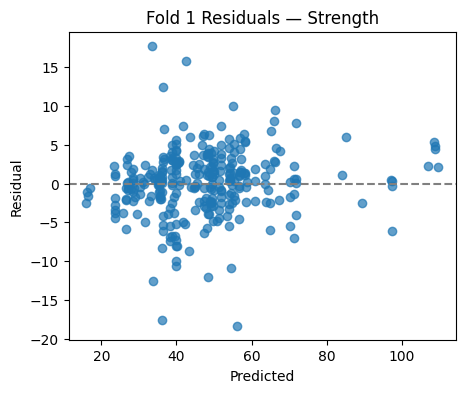

  🔁 Fold 2/5


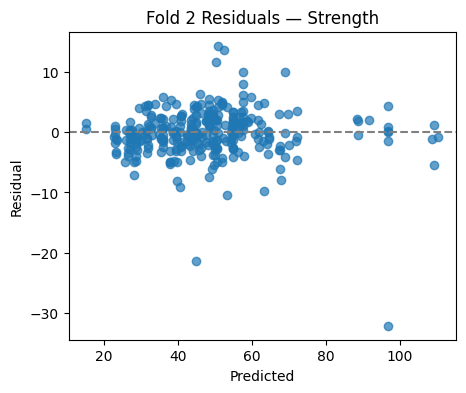

  🔁 Fold 3/5


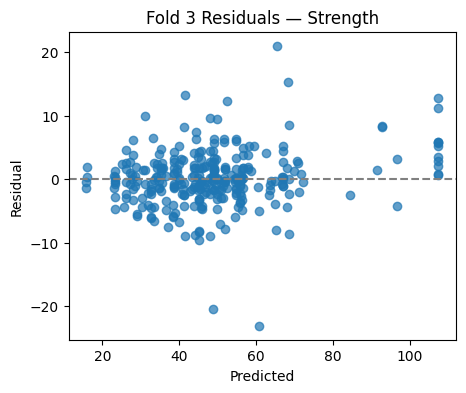

  🔁 Fold 4/5


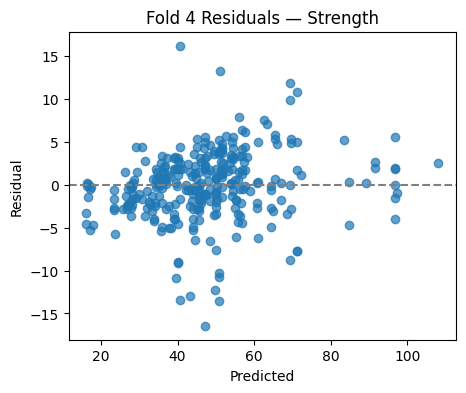

  🔁 Fold 5/5


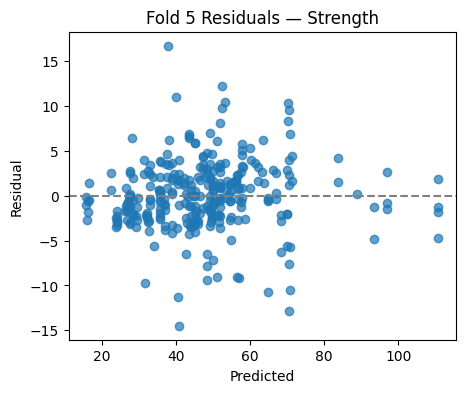


🔧 CV for target: Elongation
  🔁 Fold 1/5


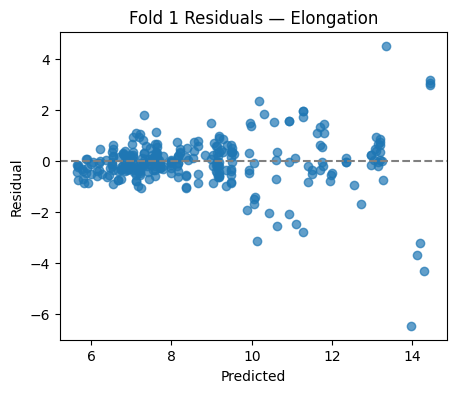

  🔁 Fold 2/5


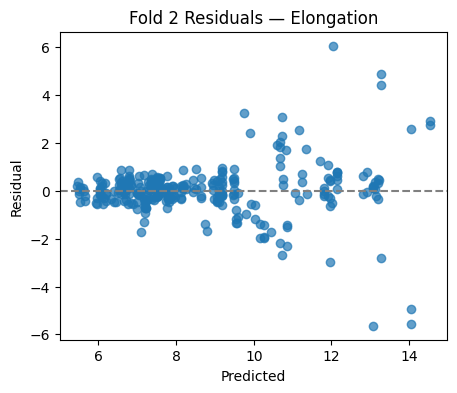

  🔁 Fold 3/5


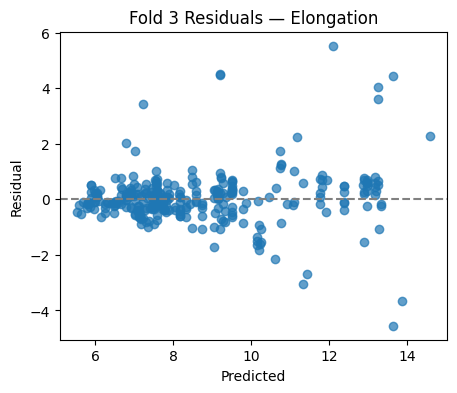

  🔁 Fold 4/5


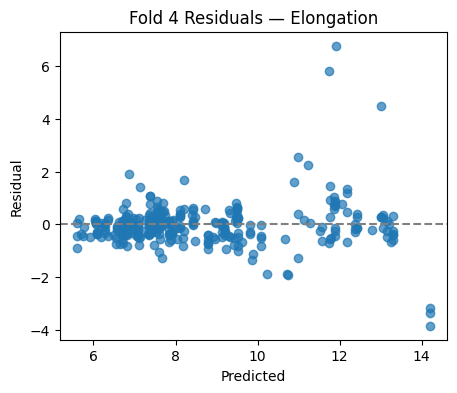

  🔁 Fold 5/5


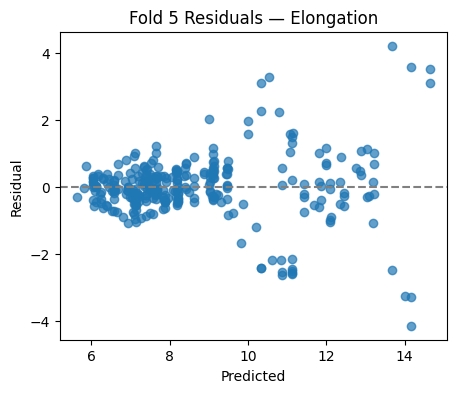


🔧 CV for target: Young's Modulus
  🔁 Fold 1/5


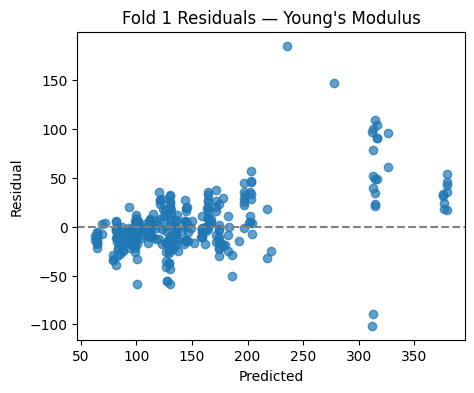

  🔁 Fold 2/5


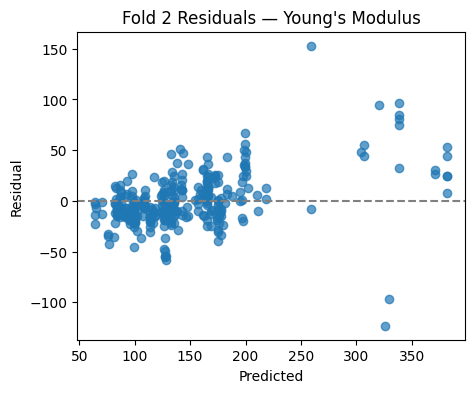

  🔁 Fold 3/5


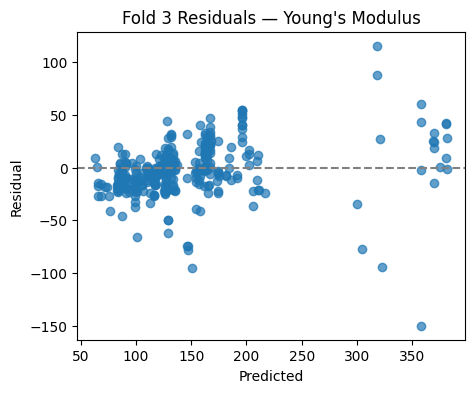

  🔁 Fold 4/5


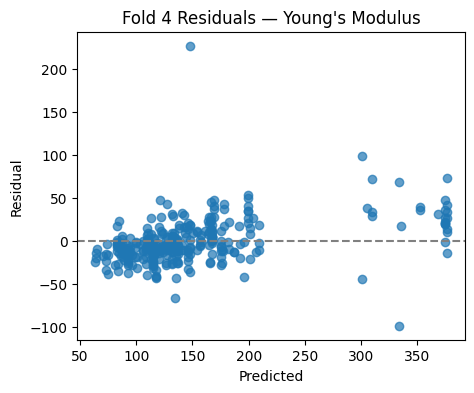

  🔁 Fold 5/5


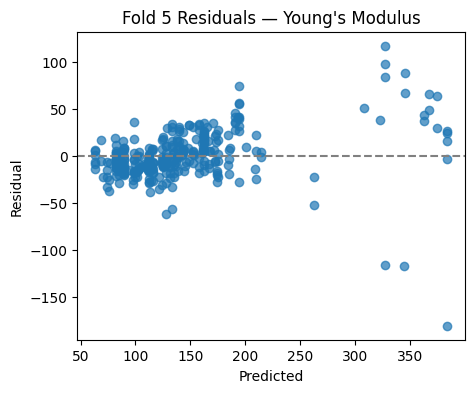

In [65]:
cv_metrics = {t: {"MAE": [], "RMSE": [], "R2": []} for t in target_cols}

for tgt in target_cols:
    print(f"\n🔧 CV for target: {tgt}")
    strata = pd.qcut(y_train[tgt], q=5, labels=False)
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

    for fold, (tr_idx, va_idx) in enumerate(skf.split(X_train_s, strata), 1):
        print(f"  🔁 Fold {fold}/5")
        X_tr, X_va = X_train_s[tr_idx], X_train_s[va_idx]
        y_tr, y_va = y_train[[tgt]].iloc[tr_idx], y_train[[tgt]].iloc[va_idx]

        ensemble_model = SubModelEnsemble(
            ensemble_map=best_meta_models[tgt],    
            base_models=tuned_base_models[tgt]  
        ).fit(X_tr, y_tr)

        preds = ensemble_model.predict(X_va)
        arr_true = y_va.values

        mae = mean_absolute_error(arr_true, preds[:, 0])
        rmse = np.sqrt(mean_squared_error(arr_true, preds[:, 0]))
        r2 = r2_score(arr_true, preds[:, 0])

        cv_metrics[tgt]["MAE"].append(mae)
        cv_metrics[tgt]["RMSE"].append(rmse)
        cv_metrics[tgt]["R2"].append(r2)

        plt.figure(figsize=(5, 4))
        plt.scatter(preds[:, 0], arr_true[:, 0] - preds[:, 0], alpha=0.7)
        plt.axhline(0, linestyle="--", color="gray")
        plt.title(f"Fold {fold} Residuals — {tgt}")
        plt.xlabel("Predicted")
        plt.ylabel("Residual")
        plt.show()

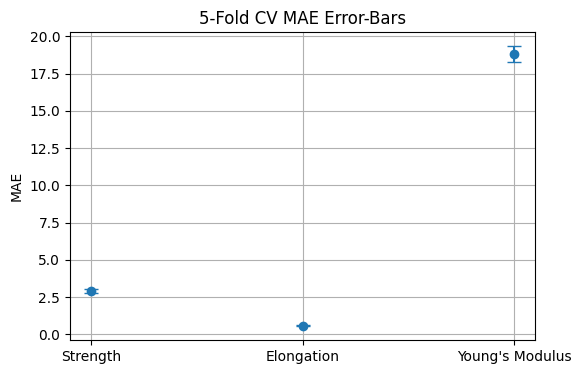

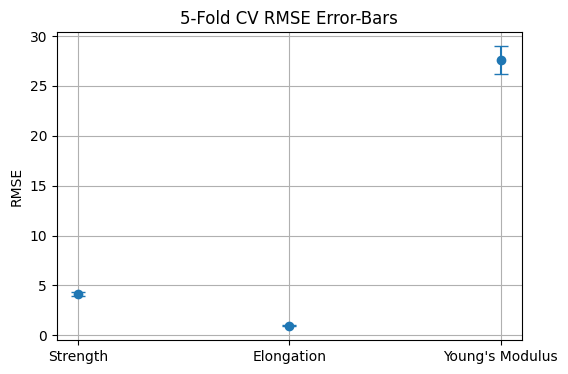

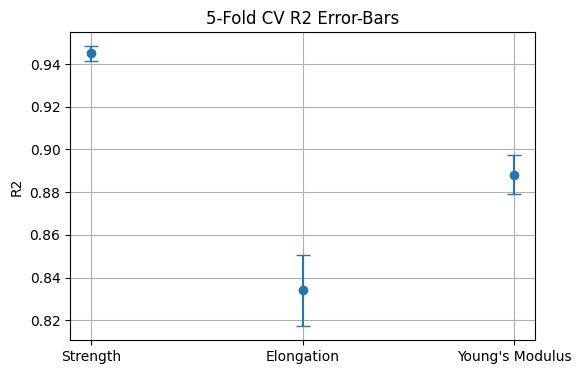

In [66]:
# Error bar plots
for metric in ["MAE", "RMSE", "R2"]:
    plt.figure(figsize=(6, 4))
    means = [np.mean(cv_metrics[t][metric]) for t in target_cols]
    stds  = [np.std(cv_metrics[t][metric]) for t in target_cols]
    plt.errorbar(target_cols, means, yerr=stds, fmt="o", capsize=5)
    plt.ylabel(metric)
    plt.title(f"5-Fold CV {metric} Error-Bars")
    plt.grid(True)
    plt.xticks()
    plt.show()

In [67]:
final_models = {}
for tgt in target_cols:
    final_models[tgt] = SubModelEnsemble(
        ensemble_map=best_meta_models[tgt],
        base_models=tuned_base_models[tgt]
    ).fit(X_train_s, y_train[[tgt]])

eval_rows = []
for tgt in target_cols:
    model = final_models[tgt]
    preds = model.predict(X_test_s)
    arr_true = y_test[[tgt]].values

    for i, (ens, base) in enumerate(model.info):
        aae  = mean_absolute_error(arr_true[:,0], preds[:,i])
        are  = np.mean(np.abs((arr_true[:,0]-preds[:,i])/(arr_true[:,0]+1e-9)))
        rmse = np.sqrt(mean_squared_error(arr_true[:,0], preds[:,i]))
        r2   = r2_score(arr_true[:,0], preds[:,i])
        eval_rows.append({
            "Ensemble": ens, "Base": base, "Target": tgt,
            "AAE": aae, "ARE": are, "RMSE": rmse, "R2": r2
        })

eval_df = pd.DataFrame(eval_rows)

print("Raw Evaluation Results (sorted by R²):")
display(eval_df.sort_values(by="R2", ascending=False))

for tgt in target_cols:
    tbl = eval_df[eval_df["Target"]==tgt].pivot(index="Ensemble", columns="Base",
                                               values=["R2","RMSE","AAE","ARE"])
    tbl.columns = [f"{metric}_{base}" for metric, base in tbl.columns]
    tbl["R2_mean"] = tbl[[c for c in tbl.columns if c.startswith("R2_")]].mean(axis=1)
    tbl = tbl.sort_values(by="R2_mean", ascending=False).drop(columns="R2_mean")
    print(f"\nPivot Table for Target: {tgt} (sorted by mean R²):")
    display(tbl.reset_index())

metric_mode = {"R2":"max", "AAE":"min", "RMSE":"min", "ARE":"min"}
best_models = {}
for metric, mode in metric_mode.items():
    best_rows = []
    for tgt in target_cols:
        tgt_df = eval_df[eval_df["Target"]==tgt]
        idx = tgt_df[metric].idxmax() if mode=="max" else tgt_df[metric].idxmin()
        best_rows.append(tgt_df.loc[idx])
    best_models[metric] = pd.DataFrame(best_rows).reset_index(drop=True)
    print(f"\nBest {metric} models per target:")
    display(best_models[metric])

Raw Evaluation Results (sorted by R²):


,Ensemble,Base,Target,AAE,ARE,RMSE,R2
4,GB,Bagging,Strength,4.201964,0.097429,5.565261,0.915620
1,GB,KNN,Strength,4.230691,0.098214,5.677032,0.912196
19,CatBoost,Bagging,Strength,4.492930,0.104210,6.134874,0.897463
16,CatBoost,KNN,Strength,4.572037,0.104928,6.277394,0.892643
17,CatBoost,RandomForest,Strength,4.616328,0.106834,6.320043,0.891179
18,CatBoost,ExtraTrees,Strength,4.667104,0.107807,6.357137,0.889898
3,GB,ExtraTrees,Strength,4.586284,0.102246,6.397510,0.888495
2,GB,RandomForest,Strength,4.626272,0.103995,6.470367,0.885941
15,CatBoost,HistGB,Strength,4.750898,0.110135,6.627324,0.880341
11,LGBM,KNN,Strength,4.766814,0.106502,6.827727,0.872994



Pivot Table for Target: Strength (sorted by mean R²):


,Ensemble,R2_Bagging,R2_ExtraTrees,R2_HistGB,R2_KNN,R2_RandomForest,RMSE_Bagging,RMSE_ExtraTrees,RMSE_HistGB,RMSE_KNN,RMSE_RandomForest,AAE_Bagging,AAE_ExtraTrees,AAE_HistGB,AAE_KNN,AAE_RandomForest,ARE_Bagging,ARE_ExtraTrees,ARE_HistGB,ARE_KNN,ARE_RandomForest
0,GB,0.915620,0.888495,0.860991,0.912196,0.885941,5.565261,6.397510,7.143091,5.677032,6.470367,4.201964,4.586284,4.842200,4.230691,4.626272,0.097429,0.102246,0.107718,0.098214,0.103995
1,CatBoost,0.897463,0.889898,0.880341,0.892643,0.891179,6.134874,6.357137,6.627324,6.277394,6.320043,4.492930,4.667104,4.750898,4.572037,4.616328,0.104210,0.107807,0.110135,0.104928,0.106834
2,LGBM,0.871792,0.866447,0.859173,0.872994,0.862609,6.859960,7.001510,7.189654,6.827727,7.101391,4.757575,4.863988,4.929919,4.766814,4.888269,0.106161,0.108835,0.110131,0.106502,0.109533
3,XGB,0.862365,0.862788,0.859490,0.864479,0.860084,7.107698,7.096768,7.181552,7.052909,7.166346,4.901164,5.026072,4.898836,5.021305,5.046676,0.106929,0.111596,0.107514,0.111301,0.111124



Pivot Table for Target: Elongation (sorted by mean R²):


,Ensemble,R2_Bagging,R2_ExtraTrees,R2_HistGB,R2_KNN,R2_RandomForest,RMSE_Bagging,RMSE_ExtraTrees,RMSE_HistGB,RMSE_KNN,RMSE_RandomForest,AAE_Bagging,AAE_ExtraTrees,AAE_HistGB,AAE_KNN,AAE_RandomForest,ARE_Bagging,ARE_ExtraTrees,ARE_HistGB,ARE_KNN,ARE_RandomForest
0,GB,0.788753,0.773350,0.747958,0.775725,0.756088,1.309419,1.356317,1.430278,1.349192,1.407019,0.841365,0.865634,0.926808,0.865503,0.890214,0.087235,0.089119,0.096156,0.089434,0.091041
1,XGB,0.785308,0.767147,0.742532,0.761925,0.751267,1.320053,1.374753,1.445591,1.390082,1.420858,0.850517,0.888981,0.952950,0.909513,0.908216,0.088517,0.092123,0.099711,0.094903,0.093684
2,CatBoost,0.741948,0.745469,0.721325,0.738185,0.741520,1.447230,1.437323,1.503947,1.457742,1.448430,0.998427,0.995527,1.034122,1.011307,1.011071,0.105664,0.106093,0.110112,0.107785,0.107835
3,LGBM,0.692289,0.700106,0.690090,0.702540,0.702426,1.580358,1.560153,1.585994,1.553809,1.554109,1.078825,1.070243,1.086994,1.064458,1.074463,0.115791,0.115334,0.117255,0.115082,0.115647



Pivot Table for Target: Young's Modulus (sorted by mean R²):


,Ensemble,R2_Bagging,R2_ExtraTrees,R2_HistGB,R2_KNN,R2_RandomForest,RMSE_Bagging,RMSE_ExtraTrees,RMSE_HistGB,RMSE_KNN,RMSE_RandomForest,AAE_Bagging,AAE_ExtraTrees,AAE_HistGB,AAE_KNN,AAE_RandomForest,ARE_Bagging,ARE_ExtraTrees,ARE_HistGB,ARE_KNN,ARE_RandomForest
0,XGB,0.867928,0.840456,0.827792,0.870349,0.835873,36.900064,40.556723,42.135605,36.560254,41.135053,26.165075,27.683922,28.365984,26.061946,27.966121,0.204341,0.207560,0.213282,0.204470,0.210378
1,LGBM,0.818285,0.789216,0.824869,0.792605,0.800213,43.282984,46.616586,42.491616,46.240418,45.384272,28.621520,29.794481,28.275017,29.185204,29.532976,0.216845,0.217342,0.214916,0.216164,0.218380
2,CatBoost,0.793865,0.783662,0.787391,0.783023,0.788389,46.099703,47.226766,46.817956,47.296535,46.708038,30.852748,31.429319,31.415644,30.992061,31.288417,0.247088,0.245610,0.249680,0.244502,0.245648
3,GB,0.779119,0.738409,0.779665,0.746862,0.757574,47.720038,51.931809,47.661124,51.085889,49.993333,32.273273,33.974071,32.364164,33.019637,33.286057,0.263412,0.267188,0.265478,0.264548,0.265544



Best R2 models per target:


,Ensemble,Base,Target,AAE,ARE,RMSE,R2
0,GB,Bagging,Strength,4.201964,0.097429,5.565261,0.915620
1,GB,Bagging,Elongation,0.841365,0.087235,1.309419,0.788753
2,XGB,KNN,Young's Modulus,26.061946,0.204470,36.560254,0.870349



Best AAE models per target:


,Ensemble,Base,Target,AAE,ARE,RMSE,R2
0,GB,Bagging,Strength,4.201964,0.097429,5.565261,0.915620
1,GB,Bagging,Elongation,0.841365,0.087235,1.309419,0.788753
2,XGB,KNN,Young's Modulus,26.061946,0.204470,36.560254,0.870349



Best RMSE models per target:


,Ensemble,Base,Target,AAE,ARE,RMSE,R2
0,GB,Bagging,Strength,4.201964,0.097429,5.565261,0.915620
1,GB,Bagging,Elongation,0.841365,0.087235,1.309419,0.788753
2,XGB,KNN,Young's Modulus,26.061946,0.204470,36.560254,0.870349



Best ARE models per target:


,Ensemble,Base,Target,AAE,ARE,RMSE,R2
0,GB,Bagging,Strength,4.201964,0.097429,5.565261,0.915620
1,GB,Bagging,Elongation,0.841365,0.087235,1.309419,0.788753
2,XGB,Bagging,Young's Modulus,26.165075,0.204341,36.900064,0.867928


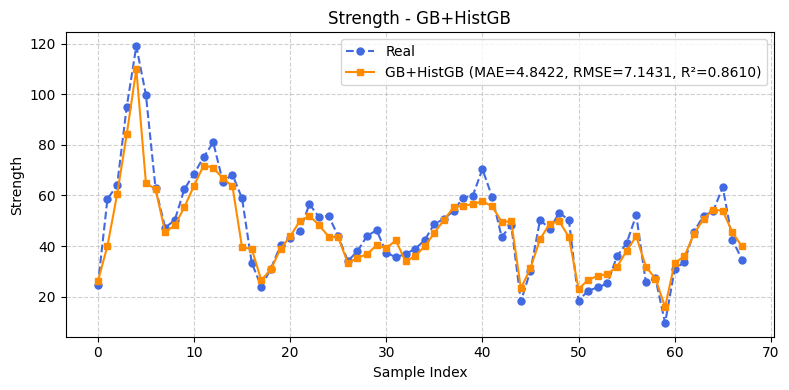

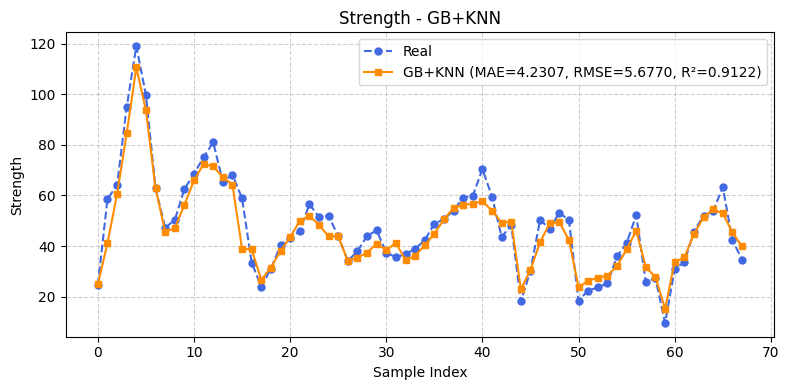

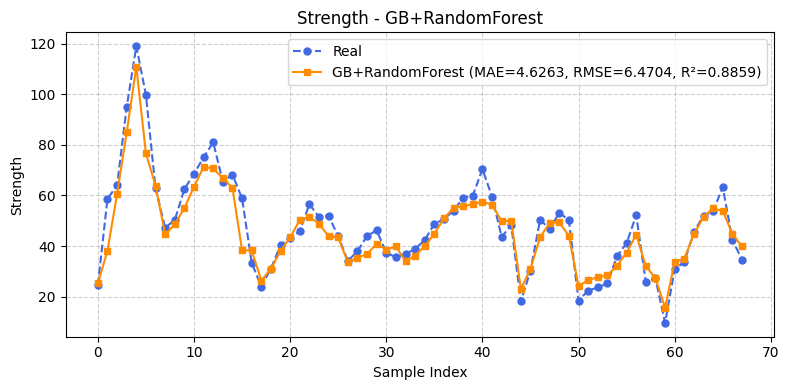

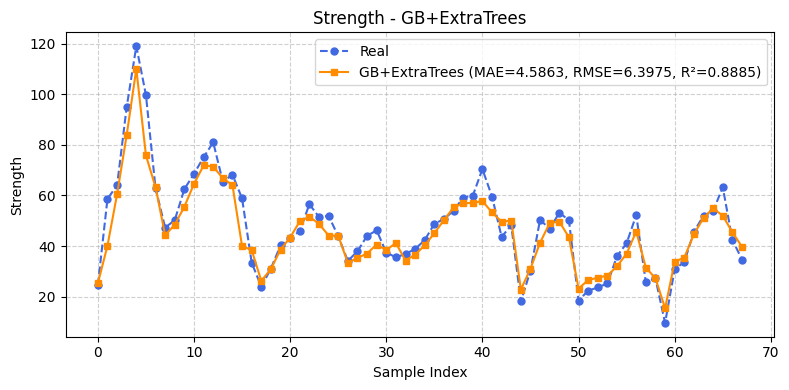

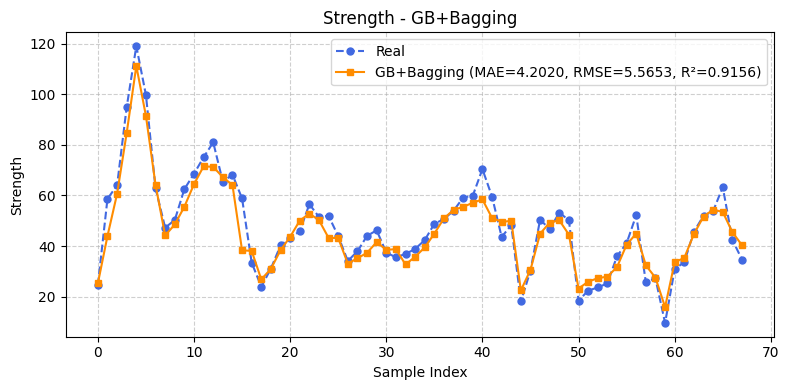

...

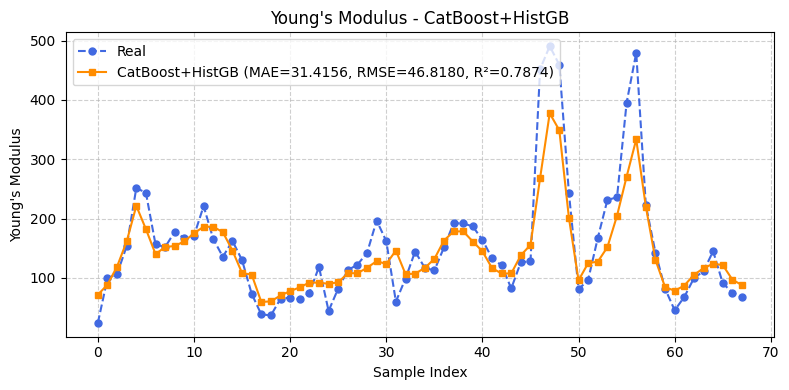

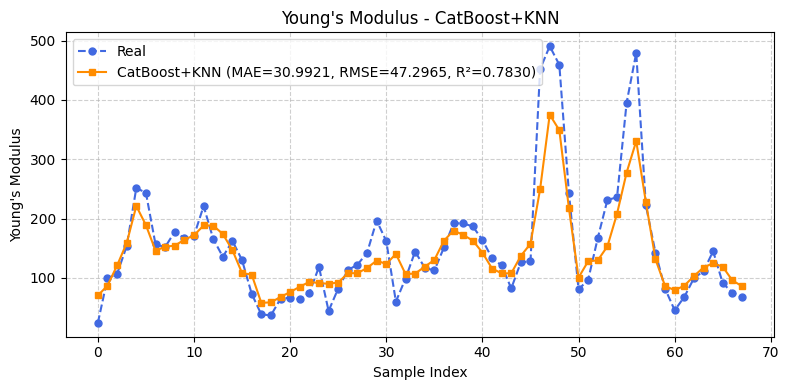

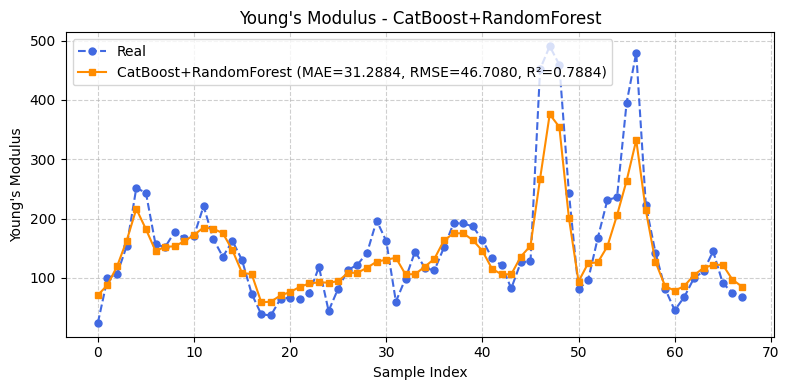

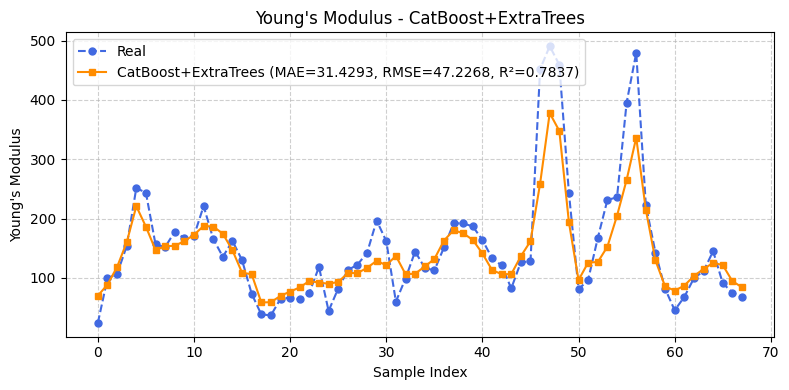

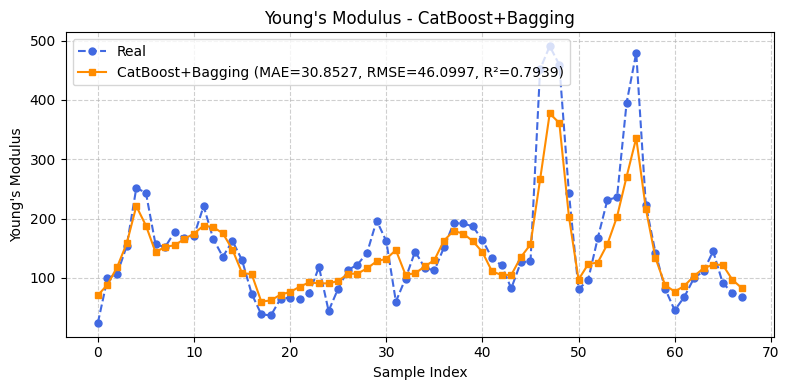

In [68]:
# Real and predicted plots for all models
for tgt in target_cols:
    model = final_models[tgt]
    preds = model.predict(X_test_s)
    arr_true = y_test[[tgt]].values.ravel()

    for i, (ens, base) in enumerate(model.info):
        y_pred = preds[:, i] 
        mae = mean_absolute_error(arr_true, y_pred)
        rmse = np.sqrt(mean_squared_error(arr_true, y_pred))
        r2 = r2_score(arr_true, y_pred)

        plt.figure(figsize=(8, 4))
        plt.plot(arr_true, "o--", label="Real", color="royalblue", markersize=5)
        plt.plot(y_pred, "s-", 
                 label=f"{ens}+{base} (MAE={mae:.4f}, RMSE={rmse:.4f}, R²={r2:.4f})",
                 color="darkorange", markersize=5)
        plt.title(f"{tgt} - {ens}+{base}")
        plt.xlabel("Sample Index")
        plt.ylabel(tgt)
        plt.legend()
        plt.grid(True, linestyle="--", alpha=0.6)
        plt.tight_layout()
        plt.show()

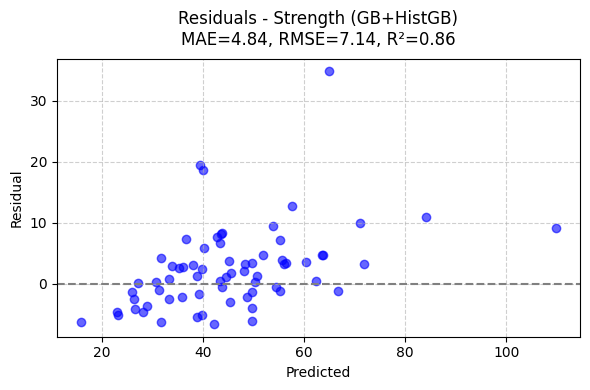

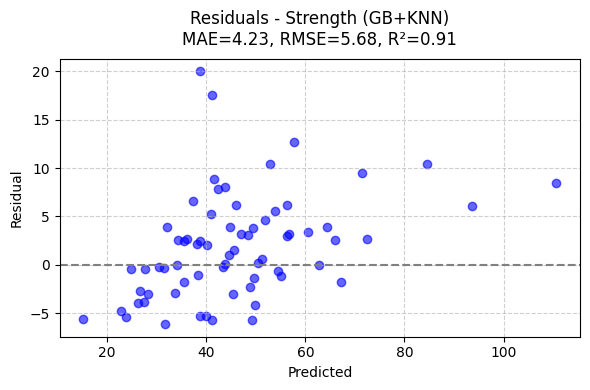

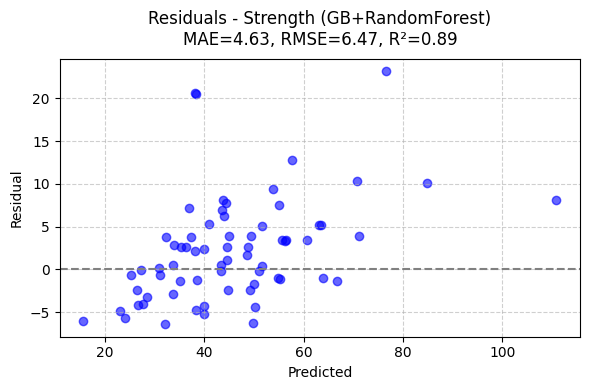

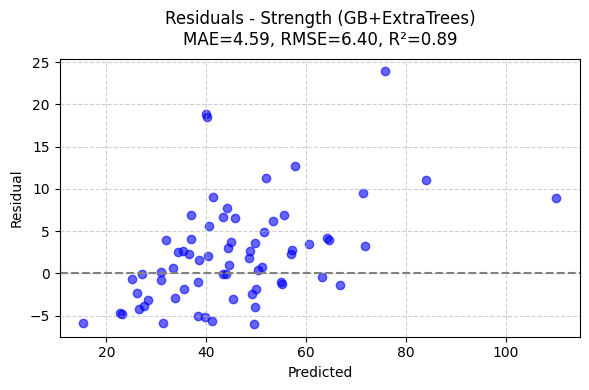

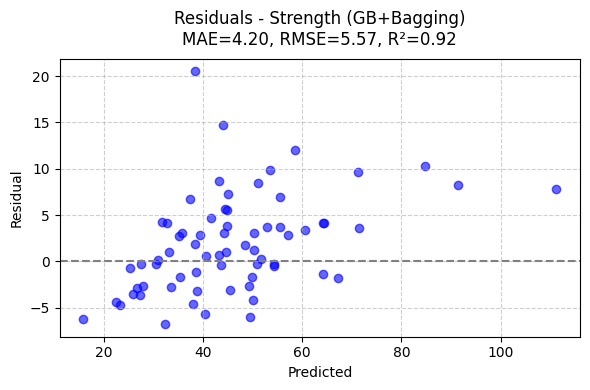

...

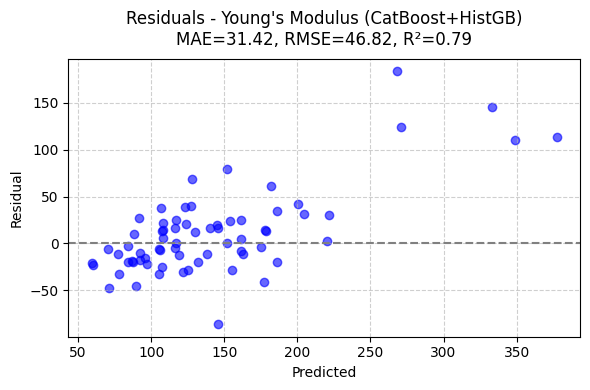

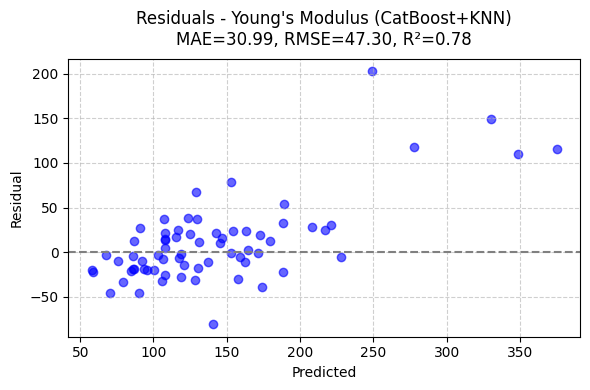

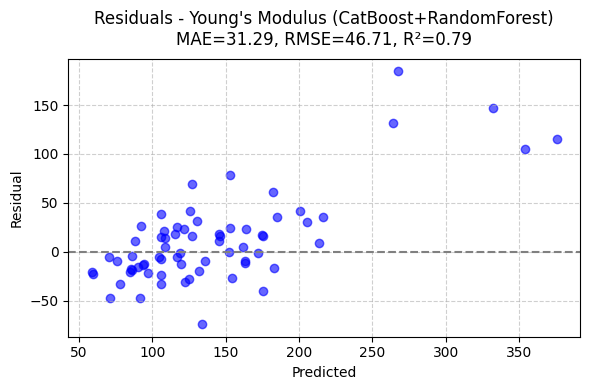

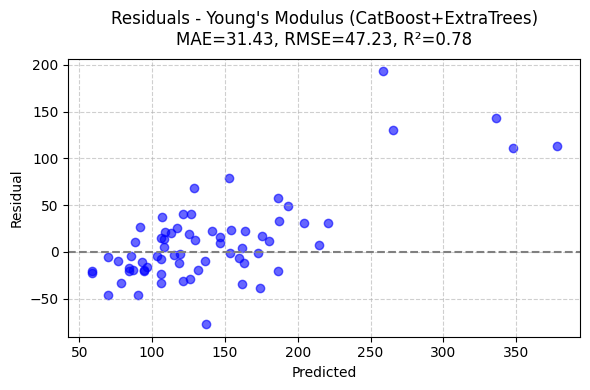

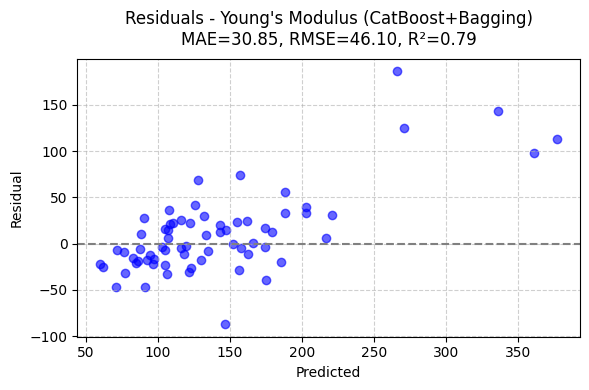

In [69]:
# Residual Plots for all models
for tgt in target_cols:
    model = final_models[tgt]
    preds = model.predict(X_test_s)
    arr_true = y_test[[tgt]].values.ravel()

    for i, (ens, base) in enumerate(model.info):
        y_pred = preds[:, i]
        residuals = arr_true - y_pred

        mae  = mean_absolute_error(arr_true, y_pred)
        rmse = np.sqrt(mean_squared_error(arr_true, y_pred))
        r2   = r2_score(arr_true, y_pred)

        plt.figure(figsize=(6, 4))
        plt.scatter(y_pred, residuals, alpha=0.6, color="blue")
        plt.axhline(0, linestyle="--", color="gray")
        
        plt.title(
            f"Residuals - {tgt} ({ens}+{base})\nMAE={mae:.2f}, RMSE={rmse:.2f}, R²={r2:.2f}", 
            pad=10 
        )
        
        plt.xlabel("Predicted")
        plt.ylabel("Residual")
        plt.grid(True, linestyle="--", alpha=0.6)
        plt.tight_layout()
        plt.show()


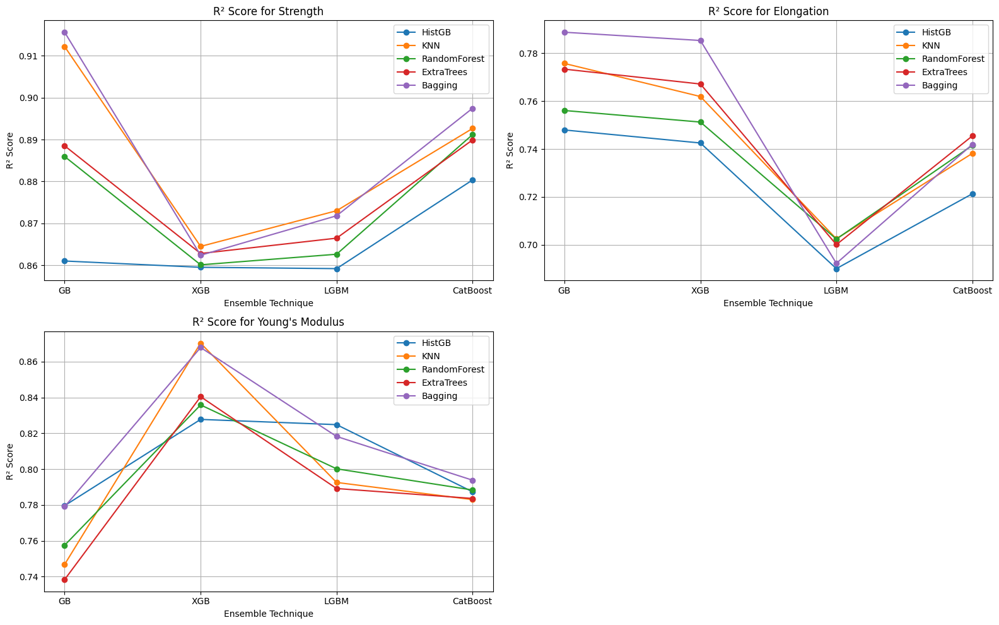

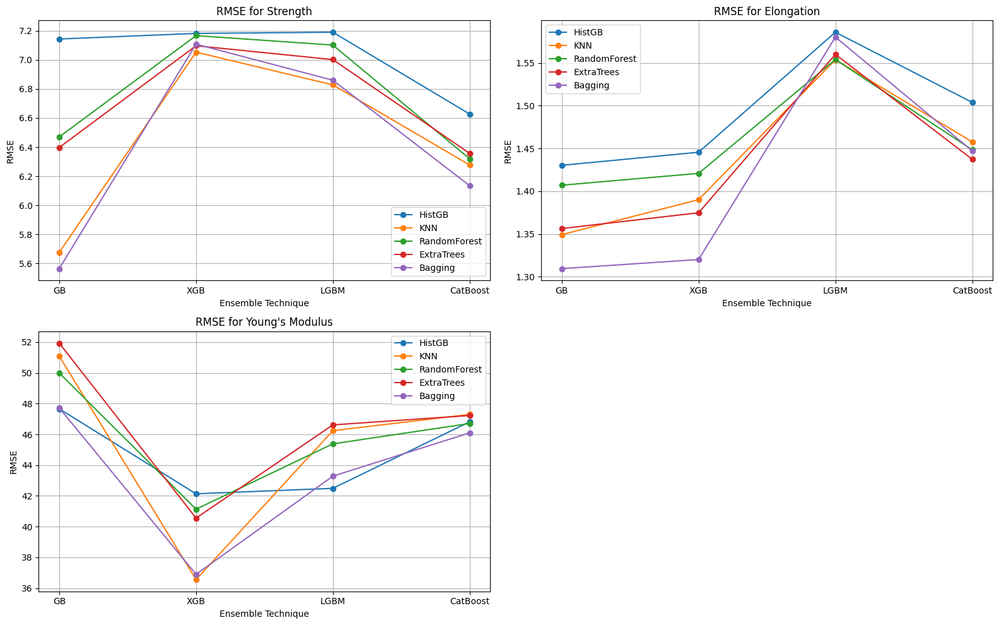

In [70]:
def plot_r2_comparisons(eval_df):
    targets = eval_df["Target"].unique()
    base_learners = eval_df["Base"].unique()

    palette = sns.color_palette("tab10", len(base_learners))
    colors = {base: palette[i % len(palette)] for i, base in enumerate(base_learners)}

    n_subplots = len(targets)
    ncols = 2
    nrows = (n_subplots + ncols - 1) // ncols 

    fig, axs = plt.subplots(nrows, ncols, figsize=(16, 5 * nrows))
    axs = axs.flatten()

    for i, tgt in enumerate(targets):
        ax = axs[i]
        df_tgt = eval_df[eval_df["Target"] == tgt]
        for base in base_learners:
            df_base = df_tgt[df_tgt["Base"] == base]
            if not df_base.empty:
                ax.plot(df_base["Ensemble"], df_base["R2"], marker='o', label=base, color=colors[base])
        ax.set_title(f"R² Score for {tgt}")
        ax.set_xlabel("Ensemble Technique")
        ax.set_ylabel("R² Score")
        ax.legend()
        ax.grid(True)

    for j in range(i + 1, len(axs)):
        axs[j].axis("off")

    plt.tight_layout()
    plt.show()

def plot_metric_comparisons(eval_df, metric="RMSE"):
    targets = eval_df["Target"].unique()
    base_learners = eval_df["Base"].unique()

    palette = sns.color_palette("tab10", len(base_learners))
    colors = {base: palette[i % len(palette)] for i, base in enumerate(base_learners)}

    n_subplots = len(targets)
    ncols = 2
    nrows = (n_subplots + ncols - 1) // ncols

    fig, axs = plt.subplots(nrows, ncols, figsize=(16, 5 * nrows))
    axs = axs.flatten()

    for i, tgt in enumerate(targets):
        ax = axs[i]
        df_tgt = eval_df[eval_df["Target"] == tgt]
        for base in base_learners:
            df_base = df_tgt[df_tgt["Base"] == base]
            if not df_base.empty:
                ax.plot(df_base["Ensemble"], df_base[metric], marker='o', label=base, color=colors[base])
        ax.set_title(f"{metric} for {tgt}")
        ax.set_xlabel("Ensemble Technique")
        ax.set_ylabel(metric)
        ax.legend()
        ax.grid(True)

    for j in range(i + 1, len(axs)):
        axs[j].axis("off")

    plt.tight_layout()
    plt.show()

plot_r2_comparisons(eval_df)
plot_metric_comparisons(eval_df, metric="RMSE") 

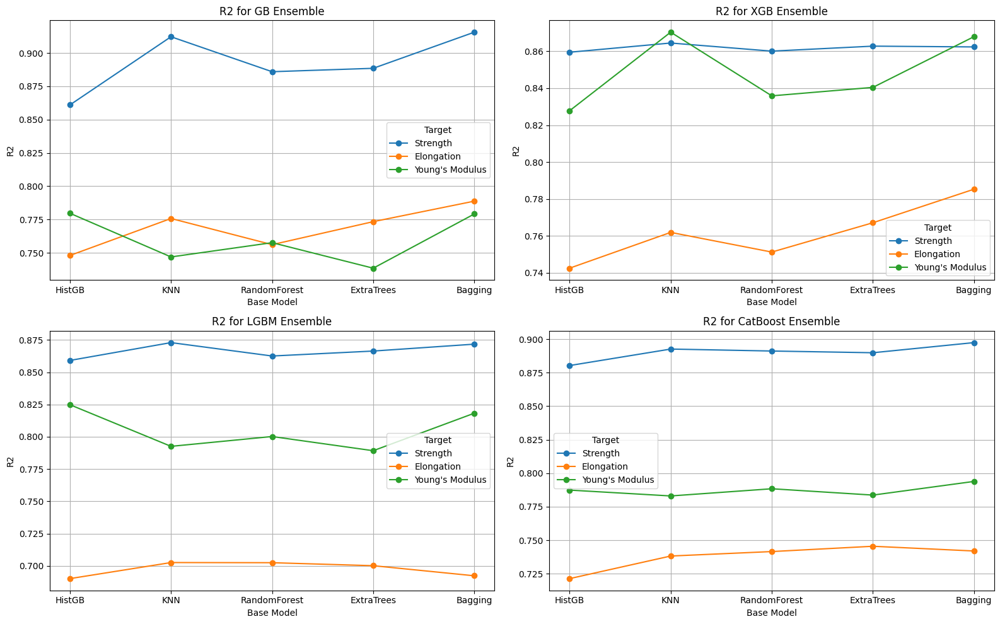

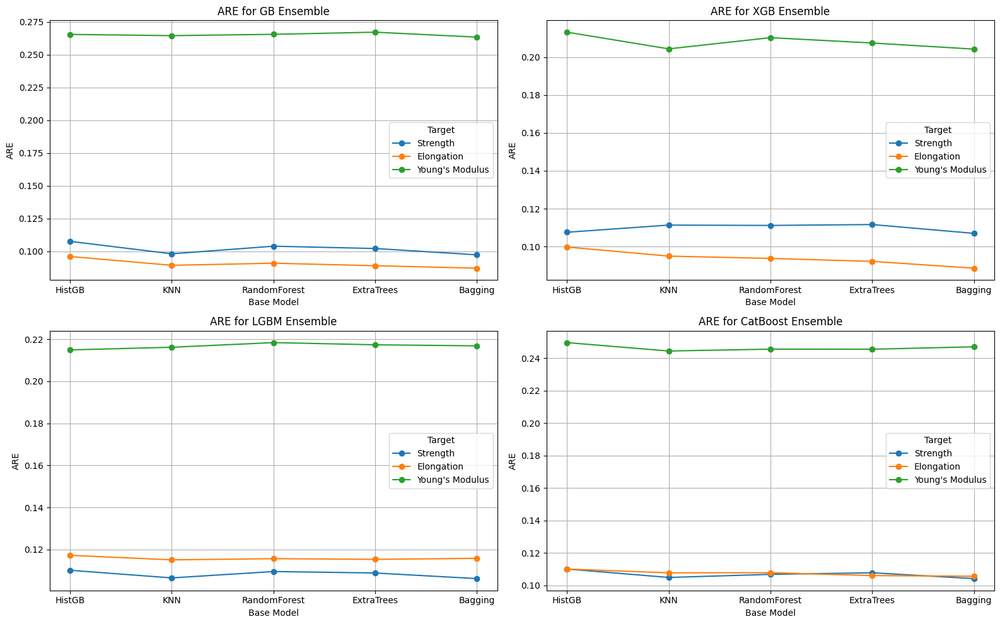

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_ensemble_comparisons(eval_df, metric="AAE"):
    
    ensembles = eval_df["Ensemble"].unique()
    targets = eval_df["Target"].unique()
    
    n_subplots = len(ensembles)
    ncols = 2
    nrows = (n_subplots + 1) // ncols
    
    fig, axs = plt.subplots(nrows, ncols, figsize=(16, 5 * nrows))
    axs = axs.flatten()
    
    for i, ens in enumerate(ensembles):
        ax = axs[i]
        df_ens = eval_df[eval_df["Ensemble"] == ens]
        target_palette = sns.color_palette("tab10", len(targets))
        colors = {tgt: target_palette[j % len(target_palette)] for j, tgt in enumerate(targets)}
        
        for tgt in targets:
            df_tgt = df_ens[df_ens["Target"] == tgt]
            if not df_tgt.empty:
                ax.plot(df_tgt["Base"], df_tgt[metric], marker='o', label=tgt, color=colors[tgt])
        
        ax.set_title(f"{metric} for {ens} Ensemble")
        ax.set_xlabel("Base Model")
        ax.set_ylabel(metric)
        ax.legend(title="Target")
        ax.grid(True)
    
    for j in range(i+1, len(axs)):
        axs[j].axis("off")
    
    plt.tight_layout()
    plt.show()

plot_ensemble_comparisons(eval_df, metric="R2")
plot_ensemble_comparisons(eval_df, metric="ARE")

In [72]:
metrics = ["R2", "RMSE", "AAE", "ARE"]
best_models_all = {}

for m in metrics:
    if m == "R2":  # maximize R2
        best_df = eval_df.loc[eval_df.groupby("Target")[m].idxmax()].reset_index(drop=True)
    else:          # minimize error metrics
        best_df = eval_df.loc[eval_df.groupby("Target")[m].idxmin()].reset_index(drop=True)

    best_models = {}
    for _, row in best_df.iterrows():
        tgt = row["Target"]
        ens, base = row["Ensemble"], row["Base"]
        sub_idx = next(i for i, info in enumerate(model.info) if info == (ens, base))
        best_models[tgt] = model.sub_models[sub_idx]

    best_models_all[m] = best_models
    print(f"\nBest models for {m}:")
    display(best_df)


Best models for R2:


,Ensemble,Base,Target,AAE,ARE,RMSE,R2
0,GB,Bagging,Elongation,0.841365,0.087235,1.309419,0.788753
1,GB,Bagging,Strength,4.201964,0.097429,5.565261,0.915620
2,XGB,KNN,Young's Modulus,26.061946,0.204470,36.560254,0.870349



Best models for RMSE:


,Ensemble,Base,Target,AAE,ARE,RMSE,R2
0,GB,Bagging,Elongation,0.841365,0.087235,1.309419,0.788753
1,GB,Bagging,Strength,4.201964,0.097429,5.565261,0.915620
2,XGB,KNN,Young's Modulus,26.061946,0.204470,36.560254,0.870349



Best models for AAE:


,Ensemble,Base,Target,AAE,ARE,RMSE,R2
0,GB,Bagging,Elongation,0.841365,0.087235,1.309419,0.788753
1,GB,Bagging,Strength,4.201964,0.097429,5.565261,0.915620
2,XGB,KNN,Young's Modulus,26.061946,0.204470,36.560254,0.870349



Best models for ARE:


,Ensemble,Base,Target,AAE,ARE,RMSE,R2
0,GB,Bagging,Elongation,0.841365,0.087235,1.309419,0.788753
1,GB,Bagging,Strength,4.201964,0.097429,5.565261,0.915620
2,XGB,Bagging,Young's Modulus,26.165075,0.204341,36.900064,0.867928


# SHAP Analysis

Generating SHAP plot for target: Strength


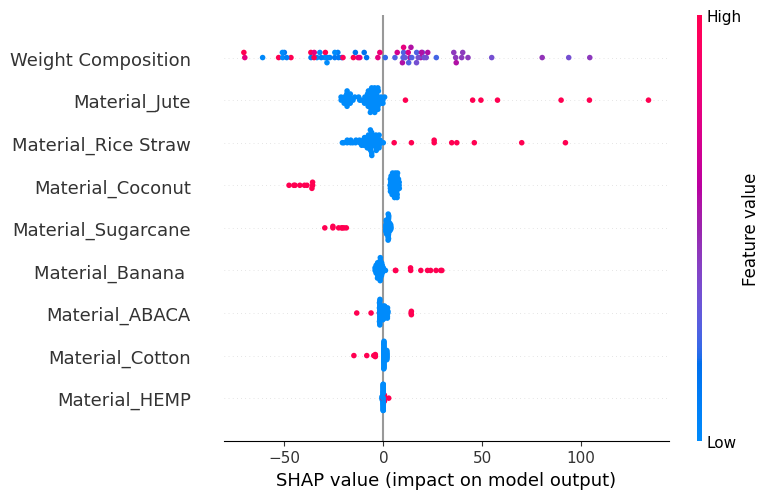

Generating SHAP plot for target: Elongation


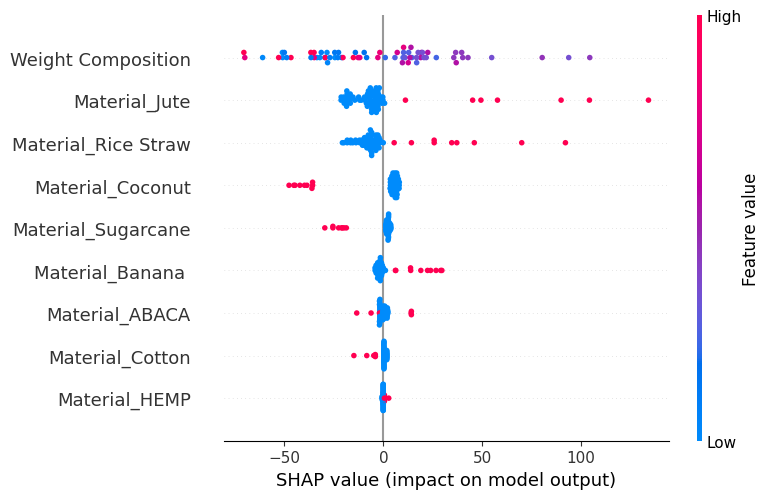

Generating SHAP plot for target: Young's Modulus


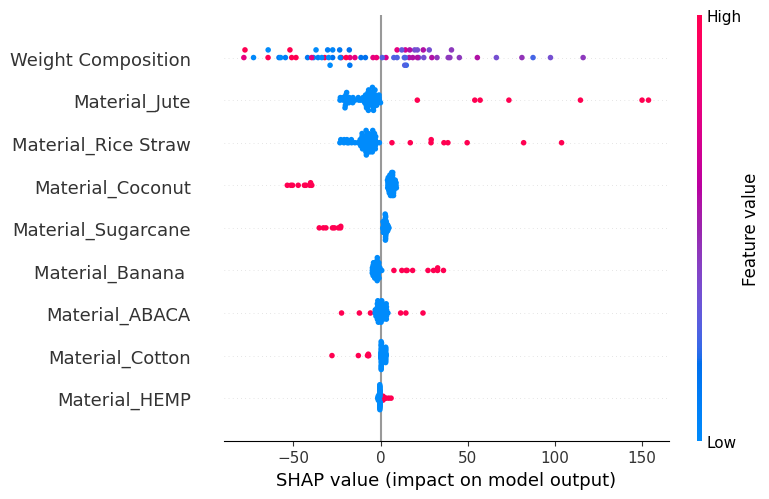

In [73]:
import shap

for target in target_cols:
    print(f"Generating SHAP plot for target: {target}")
    target_idx = target_cols.index(target)
    
    model_tgt = best_models_all["R2"][target]
    
    if hasattr(model_tgt, "estimators_"):
        model_tgt_single = model_tgt.estimators_[0]  
    else: 
        model_tgt_single = model_tgt
    
    explainer = shap.Explainer(model_tgt_single, X_train_s)
    shap_values = explainer(X_test_s)
    
    shap.summary_plot(
        shap_values, 
        X_test_s, 
        feature_names=feature_cols, 
        show=True
    )


===== SHAP LOCAL INTERPRETATION: Strength =====


  • Low (10th %ile) | Index: 59 | Base: 147.4679 | Prediction: 84.4355


<Figure size 600x300 with 0 Axes>

<Figure size 600x300 with 0 Axes>

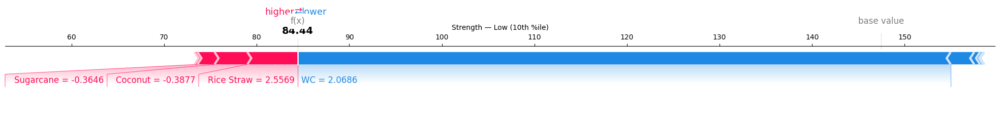

  • Median (50th %ile) | Index: 29 | Base: 147.4679 | Prediction: 128.3887


<Figure size 600x300 with 0 Axes>

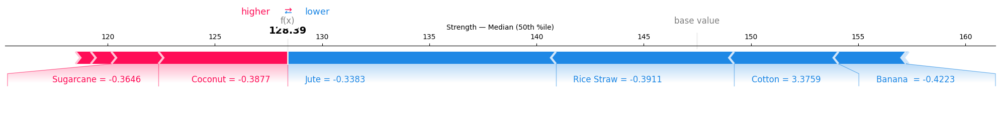

  • High (90th %ile) | Index: 54 | Base: 147.4679 | Prediction: 201.6431


<Figure size 600x300 with 0 Axes>

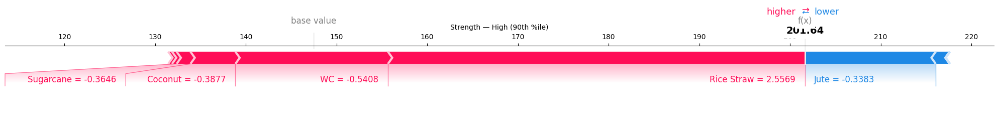


===== SHAP LOCAL INTERPRETATION: Elongation =====


  • Low (10th %ile) | Index: 59 | Base: 147.4679 | Prediction: 84.4355


<Figure size 600x300 with 0 Axes>

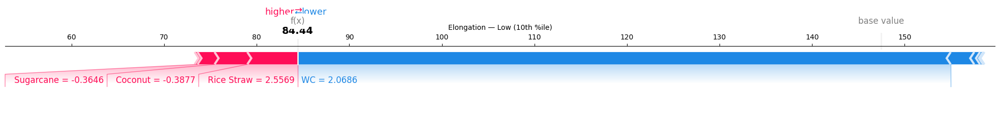

  • Median (50th %ile) | Index: 29 | Base: 147.4679 | Prediction: 128.3887


<Figure size 600x300 with 0 Axes>

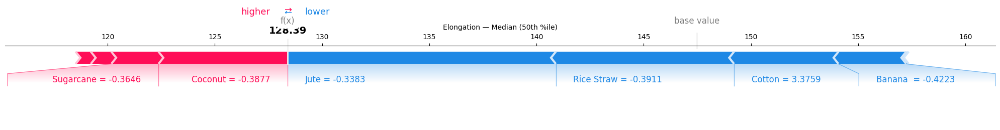

  • High (90th %ile) | Index: 54 | Base: 147.4679 | Prediction: 201.6431


<Figure size 600x300 with 0 Axes>

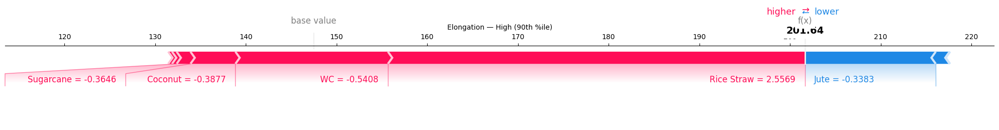


===== SHAP LOCAL INTERPRETATION: Young's Modulus =====


  • Low (10th %ile) | Index: 59 | Base: 147.5965 | Prediction: 79.01850128173828


<Figure size 600x300 with 0 Axes>

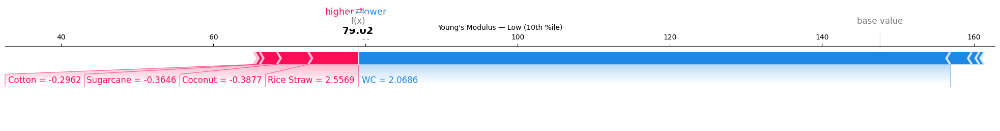

  • Median (50th %ile) | Index: 34 | Base: 147.5965 | Prediction: 123.2437973022461


<Figure size 600x300 with 0 Axes>

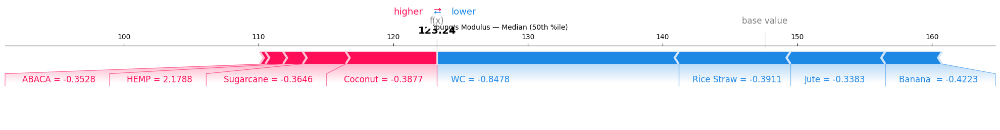

  • High (90th %ile) | Index: 57 | Base: 147.5965 | Prediction: 210.9940948486328


<Figure size 600x300 with 0 Axes>

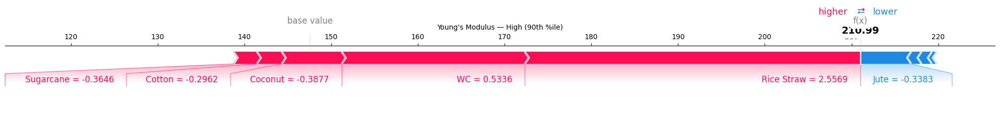

In [100]:
def shap_local_interpretation_targets(best_models, X_train, X_test, feature_cols, target_cols):
    feature_name_map = {}
    for f in feature_cols:
        if f.lower() == "weight composition":
            feature_name_map[f] = "WC"
        elif f.startswith("Material_") or f.startswith("material_"):
            feature_name_map[f] = f.split("_", 1)[-1]
        else:
            feature_name_map[f] = f

    X_test_df = pd.DataFrame(X_test, columns=feature_cols)
    X_test_df.rename(columns=feature_name_map, inplace=True)

    for tgt in target_cols:
        print(f"\n===== SHAP LOCAL INTERPRETATION: {tgt} =====")
        model_tgt = best_models[tgt]
        if hasattr(model_tgt, "estimators_"):
            model_tgt_single = model_tgt.estimators_[0]
        else:
            model_tgt_single = model_tgt

        y_pred = np.ravel(model_tgt_single.predict(X_test))
        p10, p50, p90 = np.percentile(y_pred, [10, 50, 90])
        idx_p10 = np.argmin(np.abs(y_pred - p10))
        idx_p50 = np.argmin(np.abs(y_pred - p50))
        idx_p90 = np.argmin(np.abs(y_pred - p90))
        selected_indices = [idx_p10, idx_p50, idx_p90]
        labels = ["Low (10th %ile)", "Median (50th %ile)", "High (90th %ile)"]

        try:
            explainer = shap.Explainer(model_tgt_single, X_train)
            shap_values = explainer(X_test)
        except Exception as e:
            print(f"⚠️ SHAP explainer failed for target {tgt}: {e}")
            continue

        shap.initjs()

        for idx, label in zip(selected_indices, labels):
            base_val = np.round(shap_values[idx].base_values, 4)
            pred_val = np.round(y_pred[idx], 4)
            print(f"  • {label} | Index: {idx} | Base: {base_val} | Prediction: {pred_val}")

            shap_vals_rounded = np.round(shap_values[idx].values, 4)
            features_rounded = np.round(X_test_df.iloc[idx], 4)

            fig = plt.figure(figsize=(6, 3))
            shap.force_plot(
                base_value=base_val,
                shap_values=shap_vals_rounded,
                features=features_rounded,
                matplotlib=True,
                show=False
            )
            plt.title(f"{tgt} — {label}", fontsize=10)
            plt.tight_layout()
            plt.show()

shap_local_interpretation_targets(best_models_all["R2"], X_train_s, X_test_s, feature_cols, target_cols)


===== SHAP LOCAL INTERPRETATION (Waterfall): Strength =====
  • Low (10th %ile) | Index: 59 | Base: 147.4679 | Prediction: 84.4355


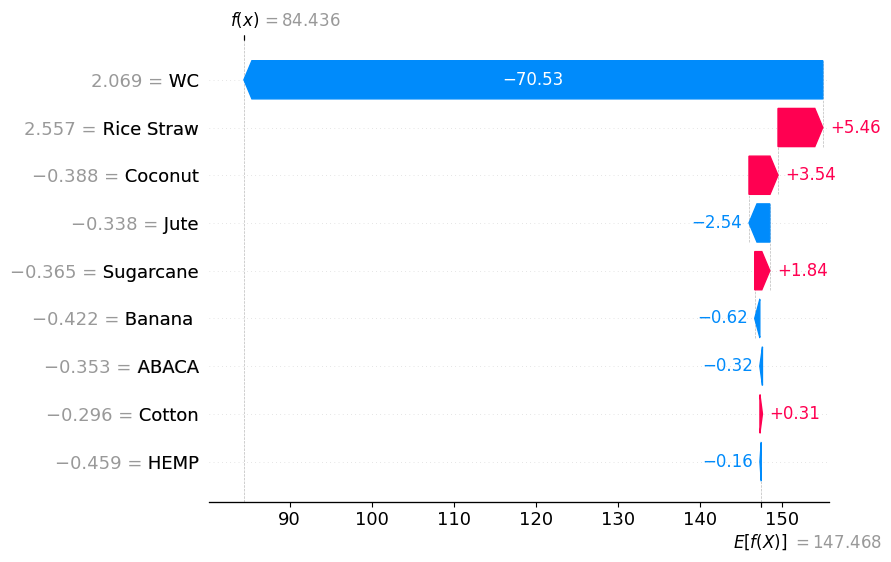

<Figure size 640x480 with 0 Axes>

  • Median (50th %ile) | Index: 29 | Base: 147.4679 | Prediction: 128.3887


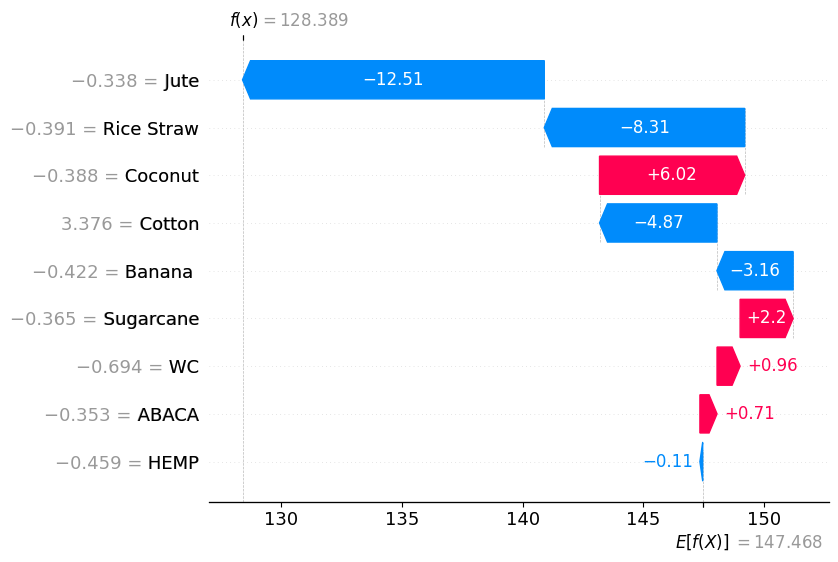

<Figure size 640x480 with 0 Axes>

  • High (90th %ile) | Index: 54 | Base: 147.4679 | Prediction: 201.6431


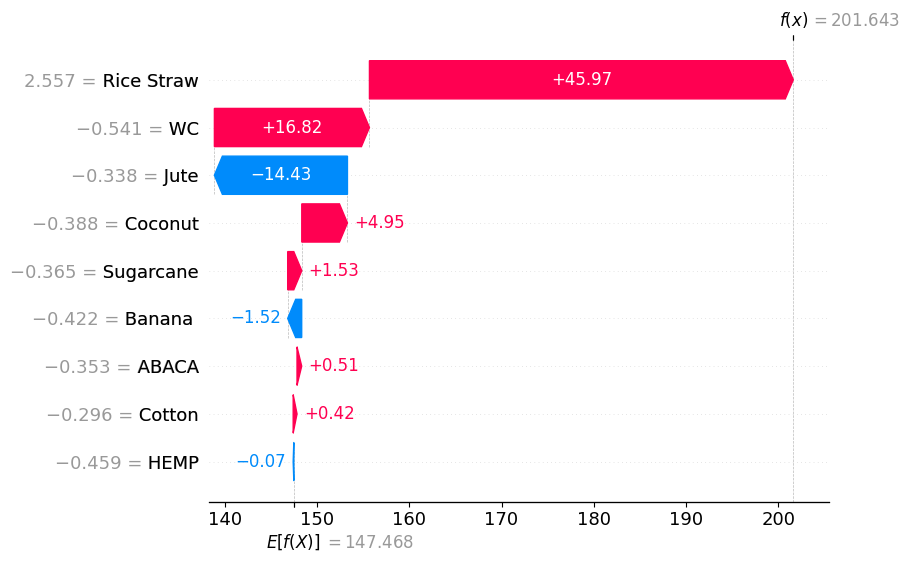

<Figure size 640x480 with 0 Axes>


===== SHAP LOCAL INTERPRETATION (Waterfall): Elongation =====
  • Low (10th %ile) | Index: 59 | Base: 147.4679 | Prediction: 84.4355


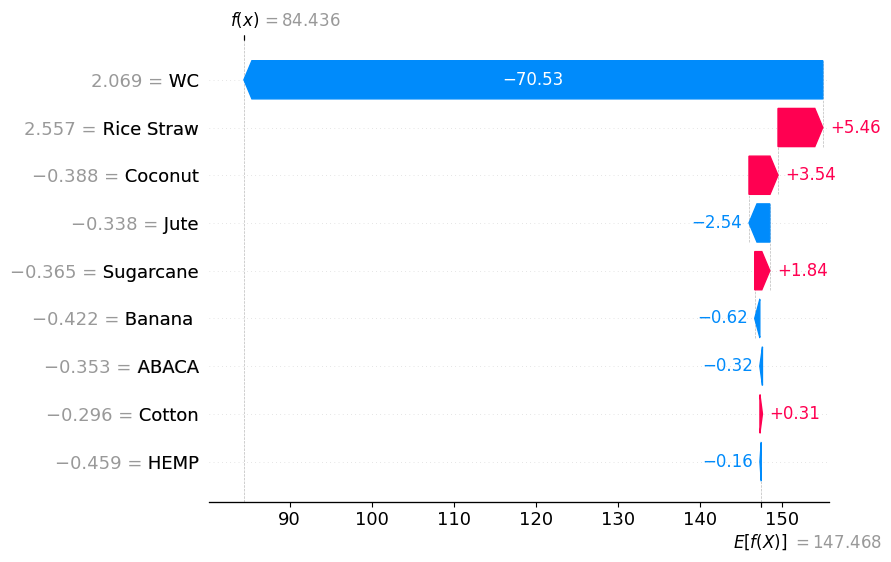

<Figure size 640x480 with 0 Axes>

  • Median (50th %ile) | Index: 29 | Base: 147.4679 | Prediction: 128.3887


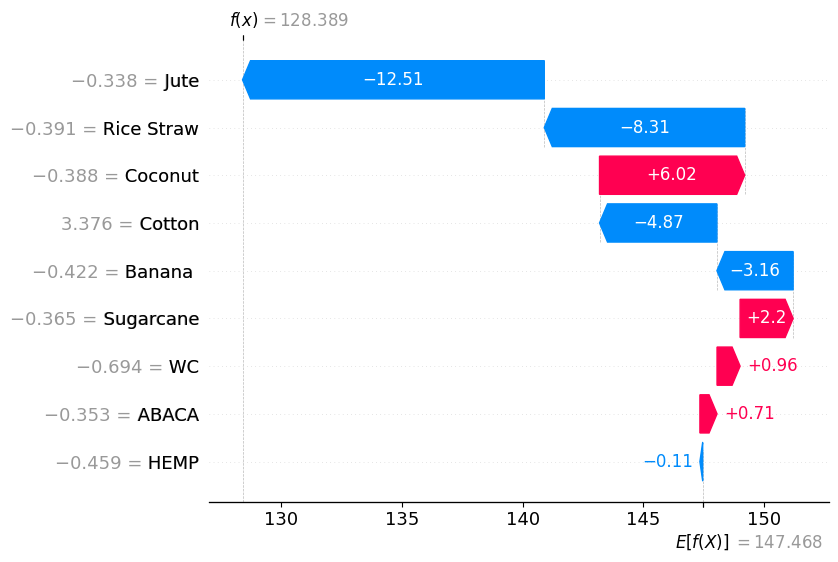

<Figure size 640x480 with 0 Axes>

  • High (90th %ile) | Index: 54 | Base: 147.4679 | Prediction: 201.6431


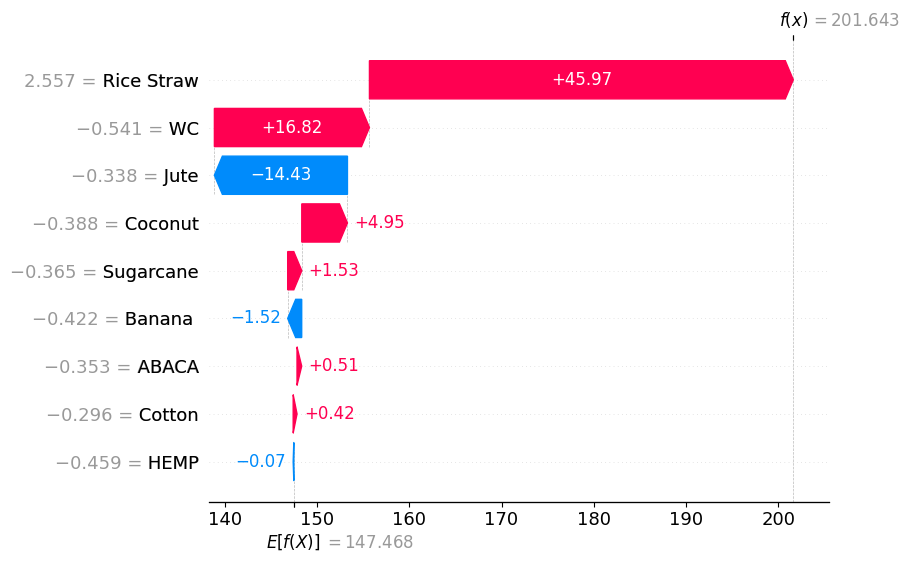

<Figure size 640x480 with 0 Axes>


===== SHAP LOCAL INTERPRETATION (Waterfall): Young's Modulus =====
  • Low (10th %ile) | Index: 59 | Base: 147.5965 | Prediction: 79.01850128173828


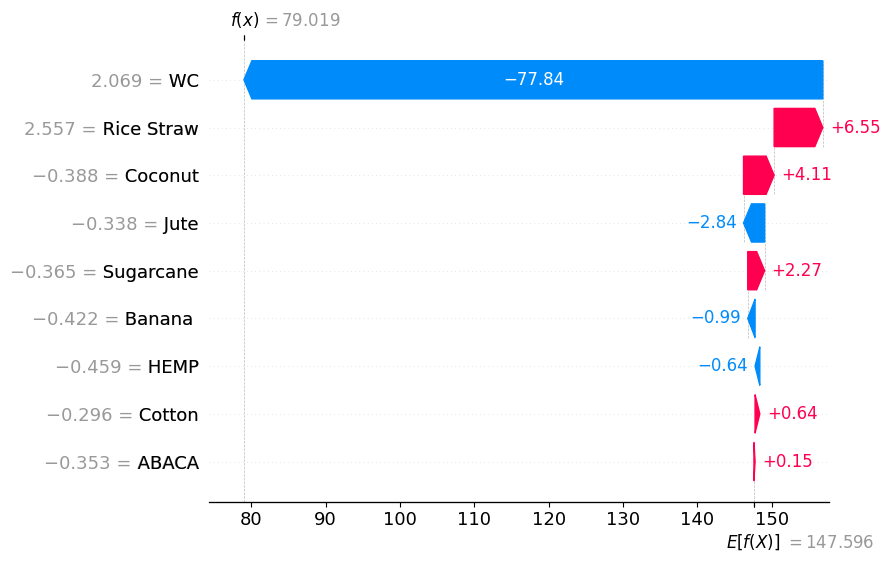

<Figure size 640x480 with 0 Axes>

  • Median (50th %ile) | Index: 34 | Base: 147.5965 | Prediction: 123.2437973022461


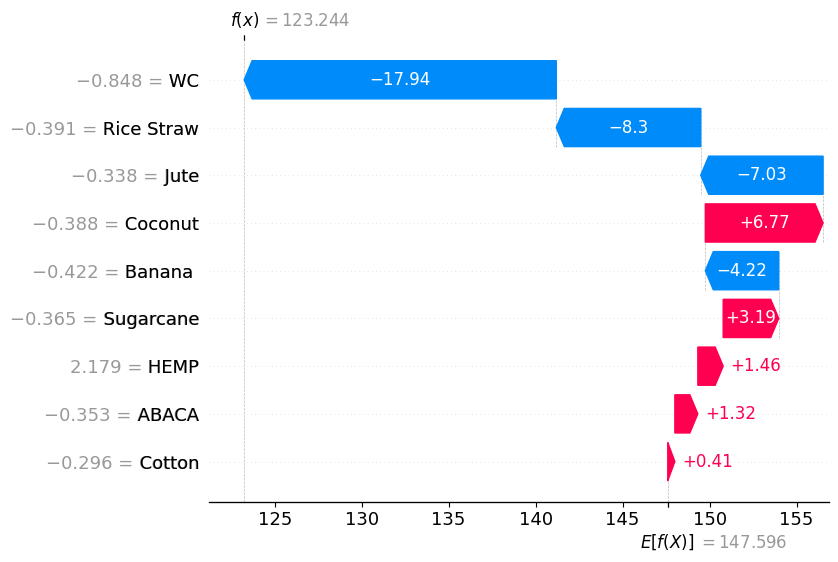

<Figure size 640x480 with 0 Axes>

  • High (90th %ile) | Index: 57 | Base: 147.5965 | Prediction: 210.9940948486328


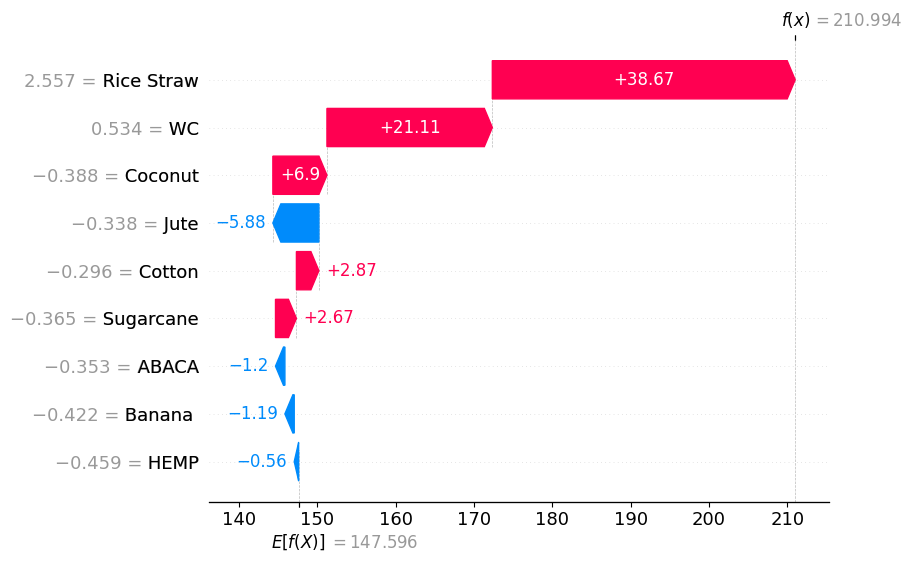

<Figure size 640x480 with 0 Axes>

In [105]:
def shap_local_waterfall(best_models, X_train, X_test, feature_cols, target_cols):
    feature_name_map = {}
    for f in feature_cols:
        if f.lower() == "weight composition":
            feature_name_map[f] = "WC"
        elif f.startswith("Material_") or f.startswith("material_"):
            feature_name_map[f] = f.split("_", 1)[-1]
        else:
            feature_name_map[f] = f

    X_test_df = pd.DataFrame(X_test, columns=feature_cols)
    X_test_df.rename(columns=feature_name_map, inplace=True)

    for tgt in target_cols:
        print(f"\n===== SHAP LOCAL INTERPRETATION (Waterfall): {tgt} =====")
        model_tgt = best_models[tgt]
        if hasattr(model_tgt, "estimators_"):
            model_tgt_single = model_tgt.estimators_[0]
        else:
            model_tgt_single = model_tgt

        y_pred = np.ravel(model_tgt_single.predict(X_test))
        p10, p50, p90 = np.percentile(y_pred, [10, 50, 90])
        idx_p10 = np.argmin(np.abs(y_pred - p10))
        idx_p50 = np.argmin(np.abs(y_pred - p50))
        idx_p90 = np.argmin(np.abs(y_pred - p90))
        selected_indices = [idx_p10, idx_p50, idx_p90]
        labels = ["Low (10th %ile)", "Median (50th %ile)", "High (90th %ile)"]

        try:
            explainer = shap.Explainer(model_tgt_single, X_train)
            shap_values = explainer(X_test)
        except Exception as e:
            print(f"⚠️ SHAP explainer failed for target {tgt}: {e}")
            continue

        for idx, label in zip(selected_indices, labels):
            base_val = np.round(shap_values[idx].base_values, 4)
            pred_val = np.round(y_pred[idx], 4)
            print(f"  • {label} | Index: {idx} | Base: {base_val} | Prediction: {pred_val}")

            shap_vals_rounded = shap_values[idx].values
            features_rounded = X_test_df.iloc[idx]

            expl = shap.Explanation(values=shap_vals_rounded,
                                    base_values=base_val,
                                    data=features_rounded,
                                    feature_names=features_rounded.index)
            shap.plots.waterfall(expl, max_display=10)
        
            plt.tight_layout()
            plt.show()

shap_local_waterfall(
    best_models=best_models_all["R2"],
    X_train=X_train_s,
    X_test=X_test_s,
    feature_cols=feature_cols,
    target_cols=target_cols
)